In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import re
import json
import pickle
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from bpemb import BPEmb
from sklearn import svm
from sklearn import metrics
from pathlib import PosixPath
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
import warnings
from pathlib import Path 
import glob
import math 
import cv2
from sklearn.model_selection import StratifiedShuffleSplit, train_test_split
import numpy as np
import re
from sklearn.svm import LinearSVC, SVC
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import seaborn as sns
warnings.filterwarnings("ignore")

In [3]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# Key Field Extraction

In [4]:
DATA_DIR = Path("../data/interim/2022-01-06_combined_orc_kyc-key-fields")
FILE_TYPE = "KTP"

## PREPROCESS into token df

In [6]:
def bboxs_for_file(file):
    base = os.path.basename(file).split('.')[0]
    yolo_file = DATA_DIR/FILE_TYPE / (base + ".txt")
    json_file = DATA_DIR/FILE_TYPE/ (base + ".json")

    if not os.path.exists(yolo_file):
        print(f"{yolo_file} does not exist")
        return []

    if not os.path.exists(json_file):
        print(f"{json_file} does not exist")
        return []

    yolo = None 
    with open(yolo_file, "r") as of:
        yolo = of.read().split('\n')
    yolo_bboxs = [l.split(' ') for l in yolo if len(l)>0]

    text_response = None 
    with open(json_file, "r") as of:
        text_response = json.load(of)


    imgw, imgh = text_response['fullTextAnnotation']['pages'][0]['width'], text_response['fullTextAnnotation']['pages'][0]['height']
    bboxs = []

    if ('textAnnotations' in text_response):
        for i,text in enumerate(text_response['textAnnotations']):
            boxes = {}
        
            x1 = text['boundingPoly']['vertices'][0].get('x',0)
            y1 = text['boundingPoly']['vertices'][0].get('y',0)
            x2 = text['boundingPoly']['vertices'][1].get('x',0)
            y2 = text['boundingPoly']['vertices'][1].get('y',0)
            x3 = text['boundingPoly']['vertices'][2].get('x',0)
            y3 = text['boundingPoly']['vertices'][2].get('y',0)
            x4 = text['boundingPoly']['vertices'][3].get('x',0)
            y4 = text['boundingPoly']['vertices'][3].get('y',0)
            

            xmin = min(x1, x4)
            xmax = max(x2, x3)
            cx = (xmax + xmin) // 2

            ymin = min(y1, y2)
            ymax = max(y3, y4)
            cy = (ymax + ymin) // 2

            center = ( cx/imgw , cy/imgh )
            width = (x2-x1)/imgw
            height = (y3-y2)/imgh

            #doublecheck the box assignment
            tag = 0
            for yolo_b in yolo_bboxs:
                if (abs(float(center[0])-float(yolo_b[1])) < 5e-3) and (abs(float(center[1])-float(yolo_b[2])) < 5e-3):
                    tag = int(yolo_b[0])
                    break

            # if base == 'KTP3' and text['description'] == 'Berlaku':
            #     print()
            #     print(text['description'], tag)
            #     print(center)
            #     print(width, height)
            #     print(x1, y1, x2,y2, x3,y3, x4,y4)
            #     print(yolo_bboxs)

            
            bboxs.append((text['description'], *center, width, height, imgw, imgh, i==0, tag))
    return bboxs

In [7]:
def load_df(DATA_DIR, FILE_TYPE):
    files = glob.glob(str(DATA_DIR/FILE_TYPE/"*.jpeg")) + glob.glob(str(DATA_DIR/FILE_TYPE/"*.jpg")) + glob.glob(str(DATA_DIR/FILE_TYPE/"*.webp")) + glob.glob(str(DATA_DIR/FILE_TYPE/"*.png")) 
    rows = []

    bboxs_all = []
    for f in files: 
        bboxs = bboxs_for_file(f)
        bboxs_all.extend([(os.path.basename(f), *bb) for bb in bboxs])
        
    df = pd.DataFrame(bboxs_all, columns=['file', 'text', 'cx', 'cy', 'w', 'h', 'imgw', 'imgh', 'is_first', 'tag'])
    df['cx'] = df['cx'].astype(np.float32)
    df['cy'] = df['cy'].astype(np.float32)
    df['w'] = df['w'].astype(np.float32)
    df['h'] = df['h'].astype(np.float32)
    df['is_first'] = df['is_first'].astype(bool)
    df['tag'] = df['tag'].astype(np.int)



    df = df[~((df['file'] == '202106100904_0.jpg') | (df['file'] == '202106100904_16.jpg')| (df['file'] == 'STNK9.jpeg')) ] #stnk
    df = df[~(df['file'].str.contains('denoising') | (df['file'] == 'All_KYC_Docs_50.jpg'))] #blurry docs
    df = df[~(df['file'] == '202106100907_0a.jpg')]
    
    #manual inspection removing invalid ones 
    df = df[~(df['file'].isin(['202106100909_2.jpg', '202106100912_12a.jpg', '202106100918_0a.jpg', 
                     '202106100918_4.jpg', '202106100918_9a.jpg', '202106100923_1a.jpg', 
                     '202106100924_0.jpg', '202106100924_3a.jpg', '202106100925_0.jpg', 
                     'All_KYC_Docs_105b.jpg', 'All_KYC_Docs_122b.jpg', 'All_KYC_Docs_127a.jpg', 
                     'All_KYC_Docs_127.jpg', 'All_KYC_Docs_130.jpg', 'All_KYC_Docs_14b.jpg', 
                     'All_KYC_Docs_151.jpg', 'All_KYC_Docs_156b.jpg', 'All_KYC_Docs_171.jpg', 
                     'All_KYC_Docs_182.jpg', 'All_KYC_Docs_185a.jpg', 'All_KYC_Docs_194a.jpg', 
                     'All_KYC_Docs_45a.jpg', 'All_KYC_Docs_45.jpg', 'All_KYC_Docs_58a.jpg', 
                     'All_KYC_Docs_90b.jpg', 'All_KYC_Docs_99c.jpg', 'Copy_STNK_&_KTP_10.jpg', 
                     'Copy_STNK_&_KTP_19a.jpg', 'Copy_STNK_&_KTP_2a.jpg', 'Copy_STNK_&_KTP_4b.jpg', 
                     'Copy_STNK_&_KTP_6a.jpg', 'Copy_STNK_&_KTP_6.jpg' , 'All_KYC_Docs_115a.jpg', 
                    '202106100907_5.jpg', 'KTP35.jpeg', 'KTP1.jpeg', 'KTP34.jpeg', 'KTP33.jpeg', 'KTP36.jpg']))]
    
    return df 

In [8]:
df = load_df(DATA_DIR, FILE_TYPE)

df.head()

../data/interim/2022-01-06_combined_orc_kyc-key-fields/KTP/KTP23.txt does not exist
../data/interim/2022-01-06_combined_orc_kyc-key-fields/KTP/All KYC Docs_page-0051_denoising_bg_shadow_out_area660077_4_img.txt does not exist


,file,text,cx,cy,w,h,imgw,imgh,is_first,tag
63,KTP22.jpeg,PROVINSI BANTEN\nKABUPATEN TANGERANG\nNIK : 36...,0.459916,0.422442,0.879747,0.782178,474,303,True,0
64,KTP22.jpeg,PROVINSI,0.424051,0.059406,0.154008,0.052805,474,303,False,0
65,KTP22.jpeg,BANTEN,0.582278,0.059406,0.132911,0.052805,474,303,False,0
66,KTP22.jpeg,KABUPATEN,0.386076,0.115512,0.196203,0.056106,474,303,False,0
67,KTP22.jpeg,TANGERANG,0.605485,0.115512,0.210970,0.056106,474,303,False,0


In [9]:
df['file'].unique().shape

(51,)

only 51 are valid, all others are not going to add value to the training

In [10]:
classes = []
with open(DATA_DIR/FILE_TYPE/"classes.txt") as of:
    classes = of.read().split('\n')
classes = [c for c in classes if len(c) > 0]
classes

['TEXT',
 'NIK',
 'NAMA',
 'TEXTUNUSED',
 'JENIS_KELAMIN',
 'TEMPAT/TGL_LAHIR',
 'ALAMAT',
 'RT_RW',
 'KEL_DESA',
 'KECAMATAN',
 'AGAMA',
 'STATUS_PERKAWINAN',
 'PEKERJAAN',
 'KEWARGANEGARAAN',
 'BERLAKU_HINGGA']

## Plot tokens from df

202106100925_14.jpg


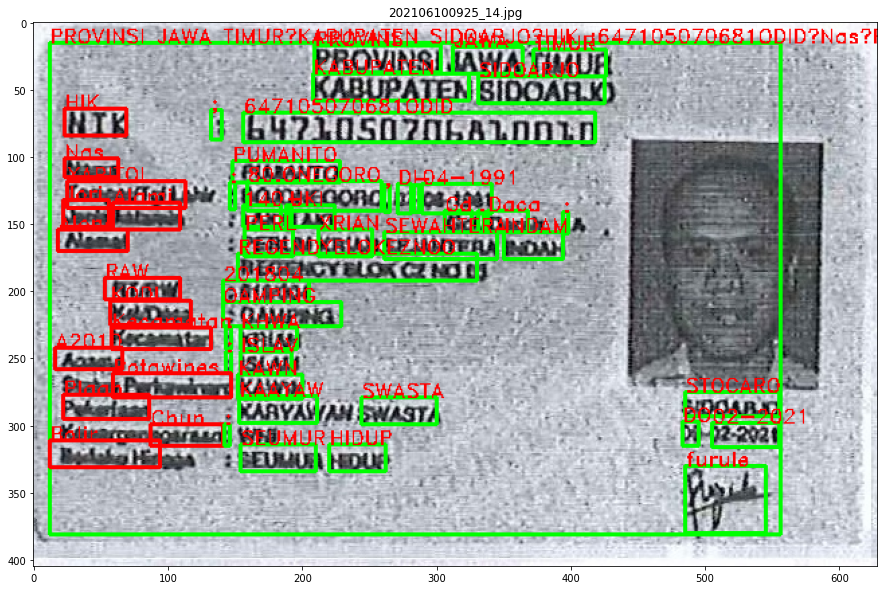

In [16]:
def plot_label(img, label, cx,cy,w,h,color=(0, 181, 20, 255), thickness=2):

    cv2.line(img, (cx-w//2, cy-h//2), (cx+w//2,cy-h//2), color, thickness)
    cv2.line(img, (cx+w//2,cy-h//2),  (cx+w//2,cy+h//2), color, thickness)
    cv2.line(img, (cx+w//2,cy+h//2), (cx-w//2,cy+h//2), color, thickness)
    cv2.line(img, (cx-w//2,cy+h//2), (cx-w//2,cy-h//2), color, thickness)
    
    cv2.putText(img, label, (cx-w//2, cy-h//2), fontFace=cv2.FONT_HERSHEY_DUPLEX,fontScale=.5,color=(255, 0, 0, 255), thickness=1)

def plot_document(df, ycol='tag'):
    REC = df.iloc[0]['file']
    img = cv2.imread(str(DATA_DIR/FILE_TYPE/REC))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    scale = 2 if img.shape[0] < 400 else 1
    img = cv2.resize(img, (img.shape[1] * scale, img.shape[0] * scale))
    
    for _,rr in df.iterrows():
        
        label = rr['text']
        cx = int(rr['cx']* img.shape[1])
        cy = int(rr['cy']* img.shape[0])
        w = int(rr['w'] * img.shape[1])
        h = int(rr['h'] * img.shape[0])

        color = (255,0,0,255) if rr['tag'] != 0  else (0,255,0,255)
        plot_label(img, label, cx, cy, w, h, color)

    return img

def plot_figure(df, ycol='tag'):
    img = plot_document(df)
    
    plt.figure(figsize=(20,10))
    plt.title(df.iloc[0]['file'])
    plt.imshow(img)
    plt.show()

file = df['file'].iloc[random.randint(0, len(df['file']))]
print(file)
file = "KTP2.jpeg"
plot_figure(df[df['file'] == file])

## Errors in annotation are not good. lets see what those are for now and fix

In [10]:
Path("/tmp/out").mkdir(exist_ok=True)
for name,  group in df.groupby('file'):
    img = plot_document(df[df['file'] ==name])
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR) 
    cv2.imwrite( "/tmp/out/" + name, img)
    
#used this script to manually check each file and updated the load_df to remove those invalid files

# Feature Engineering


FC1.
- isDate
- isZipCode
- isAlpha
- isAlphaNumeric
- isNumeric
- isNumericWithSymbols
- isNumberWithDecimal
- isRealNumber
- isKnownCity
- isKnownCountry
- isCurrency
- isGender
- isNationality
 
total: 13

In [17]:
df['f_isdigit'] = df.apply(lambda x: x['text'].isdigit(), axis=1)

def is_date(x):
    from dateutil.parser import parse
    try: 
        parse(x['text'], fuzzy=False)
        return True
    except (ValueError, OverflowError):
        return False
    
df['f_isdate'] = df.apply(is_date, axis=1)

df['f_iszipcode'] = df.apply(lambda x: x['text'].isdigit() and len(x['text']) == 5, axis=1)
df['f_isalpha'] = df.apply(lambda x: x['text'].isalpha(), axis=1)
df['f_isalnum'] = df.apply(lambda x: x['text'].isalnum(), axis=1)
df['f_isnum'] = df.apply(lambda x: x['text'].isnumeric(), axis=1)
df['f_isnumsym'] = df.apply(lambda x: bool(re.search('^[0-9.,:;!?()]+$/', x['text'])), axis=1)
df['f_isnumreal'] = df.apply(lambda x: x['text'].isdigit(), axis=1)
# df['f_iscity'] = df.apply(lambda x: x['text'].isdigit(), axis=1)
# df['f_iscurrency'] = df.apply(lambda x: x['text'].isdigit(), axis=1)
# df['f_isgender'] = df.apply(lambda x: x['text'].isdigit(), axis=1)
# df['f_isnationality'] = df.apply(lambda x: x['text'].isdigit(), axis=1)

df['f_nik'] = df.apply(lambda x: (x['text'].upper() == 'NIK') or (x['text'].upper() == 'N.I.K.') or (x['text'].upper() == 'N.I.K'), axis=1)
df['f_nama'] = df.apply(lambda x: x['text'].upper() == 'NAMA', axis=1)
df['f_jenis'] = df.apply(lambda x: (x['text'].upper() == 'JENIS') or (x['text'].upper() == 'KELAMIN'), axis=1)
df['f_tempat'] = df.apply(lambda x: (x['text'].upper() == 'TEMPAT') or (x['text'].upper() == 'TGL') or (x['text'].upper() == 'LAHIR'), axis=1)
# df['f_tgllahir'] = df.apply(lambda x: (x['text'].upper() == 'TGL') or (x['text'].upper() == 'LAHIR'), axis=1)
df['f_alamat'] = df.apply(lambda x: x['text'].upper() == 'ALAMAT', axis=1)
df['f_rtrw'] = df.apply(lambda x: (x['text'].upper() == 'RT') or (x['text'].upper() == 'RW') or (x['text'].upper() == 'RT/RW') or (x['text'].upper() == 'RTRW') , axis=1)
df['f_keldesa'] = df.apply(lambda x: (x['text'].upper() == 'KELDESA') or  (x['text'].upper() == 'KEL') or  (x['text'].upper() == 'DESA'), axis=1)
df['f_kecamatan'] = df.apply(lambda x: x['text'].upper() == 'KECAMATAN', axis=1)
df['f_agama'] = df.apply(lambda x: x['text'].upper() == 'AGAMA', axis=1)
df['f_status_perkawinan'] = df.apply(lambda x: (x['text'].upper() == 'STATUS') or (x['text'].upper() == 'PERKAWINAN') , axis=1)
df['f_pekerjaan'] = df.apply(lambda x: x['text'].upper() == 'PEKERJAAN', axis=1)
df['f_kewarganegaraan'] = df.apply(lambda x: x['text'].upper() == 'KEWARGANEGARAAN', axis=1)
df['f_berlaku'] = df.apply(lambda x: (x['text'].upper() == 'BERLAKU') or (x['text'].upper() == 'HINGGA'), axis=1)


def expsys_ktp(x):
    if (x['text'].upper() == 'NIK') or (x['text'].upper() == 'N.I.K.') or (x['text'].upper() == 'N.I.K'):
        return 1
    if x['text'].upper() == 'NAMA':
        return 2
    if (x['text'].upper() == 'JENIS') or (x['text'].upper() == 'KELAMIN'):
        return 4
    if (x['text'].upper() == 'TEMPAT') or (x['text'].upper() == 'TGL') or (x['text'].upper() == 'LAHIR'):
        return 5
    if x['text'].upper() == 'ALAMAT':
        return 6
    if (x['text'].upper() == 'RT') or (x['text'].upper() == 'RW') or (x['text'].upper() == 'RT/RW') or (x['text'].upper() == 'RTRW'):
        return 7
    if (x['text'].upper() == 'KELDESA') or  (x['text'].upper() == 'KEL') or  (x['text'].upper() == 'DESA'):
        return 8
    if (x['text'].upper() == 'KECAMATAN'):
        return 9
    if (x['text'].upper() == 'AGAMA'):
        return 10
    if (x['text'].upper() == 'STATUS') or (x['text'].upper() == 'PERKAWINAN'):
        return 11
    if x['text'].upper() == 'PEKERJAAN':
        return 12
    if x['text'].upper() == 'KEWARGANEGARAAN':
        return 13
    if (x['text'].upper() == 'BERLAKU') or (x['text'].upper() == 'HINGGA'):
        return 14
    return 0

df['f_y'] = df.apply(expsys_ktp, axis=1)

df['f_len'] = df.apply(lambda x: len(x['text']), axis=1)
df['ncx'] = df['cx']
df['ncy'] = df['cy']
df.head()

,file,text,cx,cy,w,h,imgw,imgh,is_first,tag,...,f_rtrw,f_keldesa,f_kecamatan,f_agama,f_status_perkawinan,f_pekerjaan,f_kewarganegaraan,f_berlaku,f_y,f_len
63,KTP22.jpeg,PROVINSI BANTEN\nKABUPATEN TANGERANG\nNIK : 36...,0.459916,0.422442,0.879747,0.782178,474,303,True,0,...,False,False,False,False,False,False,False,False,0,384
64,KTP22.jpeg,PROVINSI,0.424051,0.059406,0.154008,0.052805,474,303,False,0,...,False,False,False,False,False,False,False,False,0,8
65,KTP22.jpeg,BANTEN,0.582278,0.059406,0.132911,0.052805,474,303,False,0,...,False,False,False,False,False,False,False,False,0,6
66,KTP22.jpeg,KABUPATEN,0.386076,0.115512,0.196203,0.056106,474,303,False,0,...,False,False,False,False,False,False,False,False,0,9
67,KTP22.jpeg,TANGERANG,0.605485,0.115512,0.210970,0.056106,474,303,False,0,...,False,False,False,False,False,False,False,False,0,9


11
                        file       text        cx        cy         w  \
1742               KTP2.jpeg    Bertaku  0.088319  0.752599  0.076923   
1947              KTP25.jpeg    Barlaku  0.063158  0.765914  0.080263   
2619     202106100925_14.jpg      Bolir  0.084261  0.795062  0.131955   
2677    202106100907_13a.jpg    Perlaku  0.057798  0.792023  0.079817   
2990     202106100918_12.jpg    Bariaku  0.069394  0.743450  0.081812   
3415    All_KYC_Docs_115.jpg    Berlalu  0.144681  0.723711  0.075177   
3416    All_KYC_Docs_115.jpg     Hinggr  0.221277  0.719588  0.075177   
3472    All_KYC_Docs_15a.jpg         wu  0.020106  0.812308  0.027513   
5043   All_KYC_Docs_117b.jpg    Borisku  0.096330  0.752155  0.082569   
5044   All_KYC_Docs_117b.jpg     Hihops  0.185015  0.752155  0.074924   
5162  Copy_STNK_&_KTP_21.jpg  Berlatina  0.102009  0.802752  0.165379   

             h  imgw  imgh  is_first  tag  ...  f_rtrw  f_keldesa  \
1742  0.041580   702   481     False   14  ...   Fa

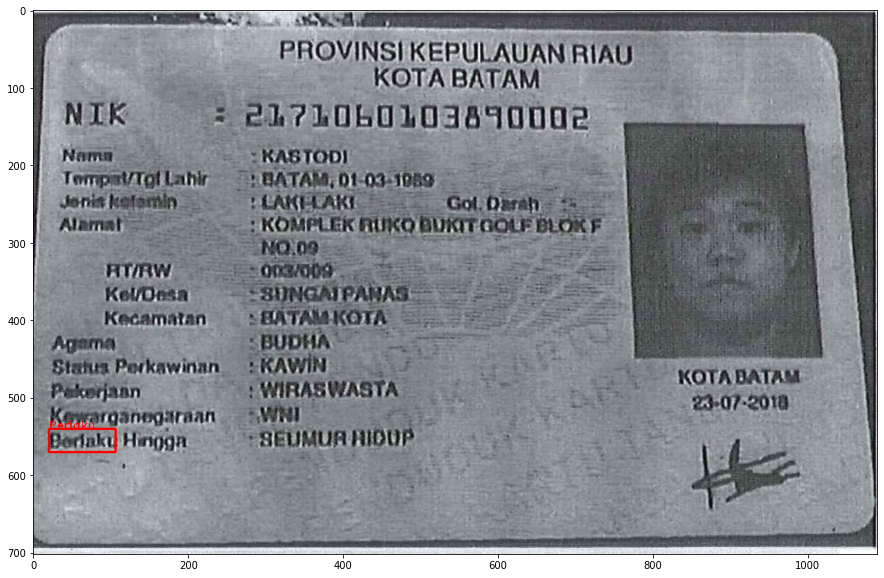

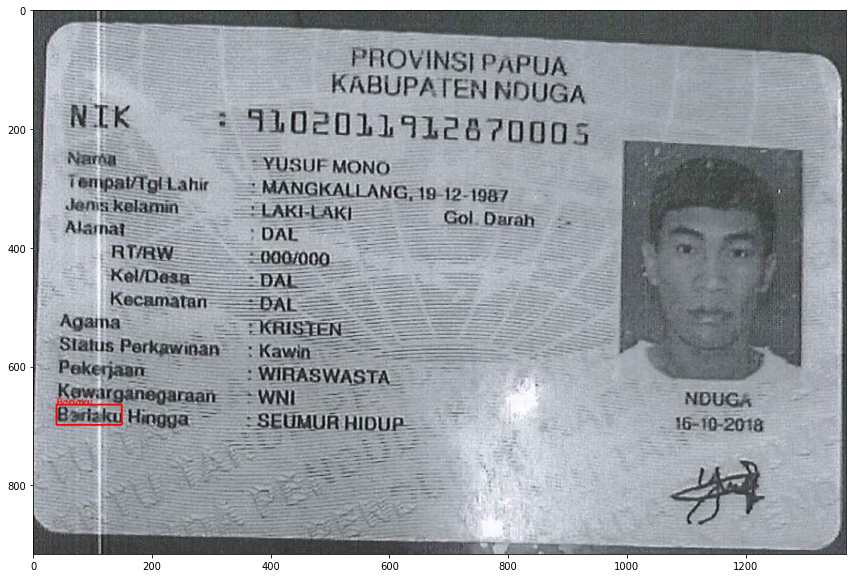

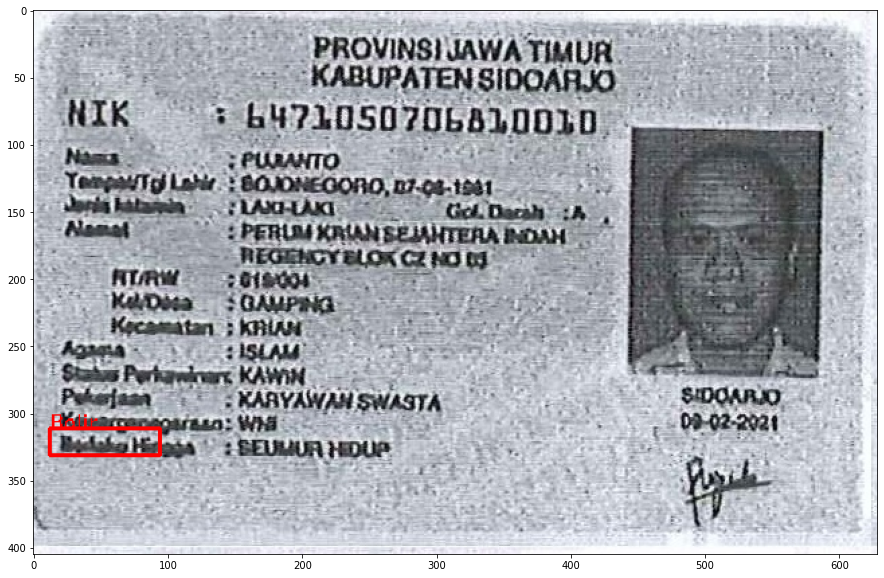

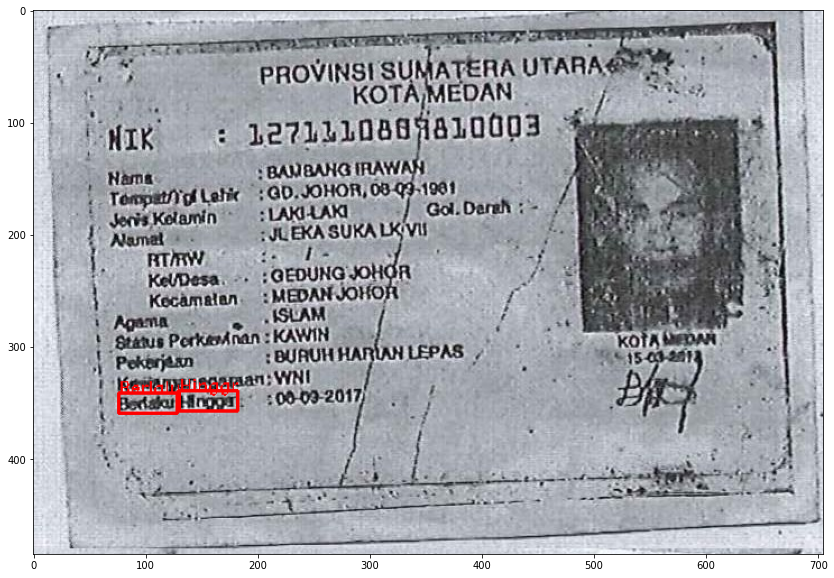

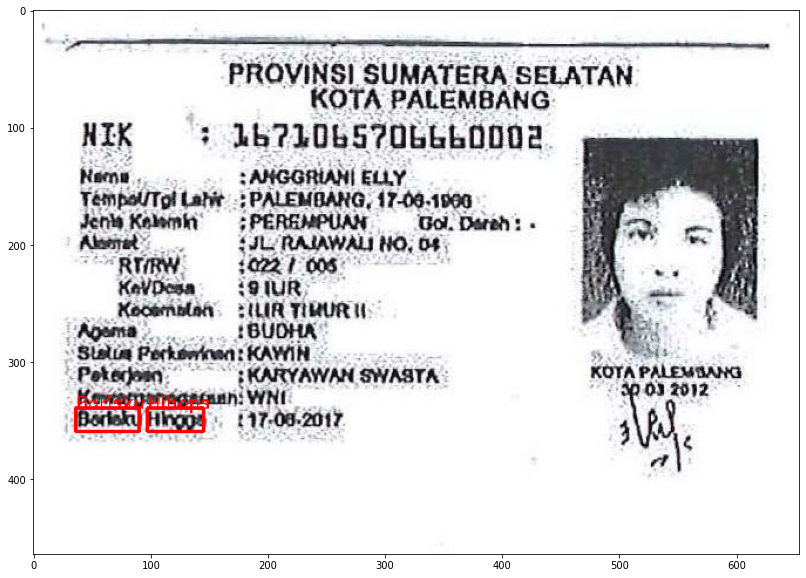

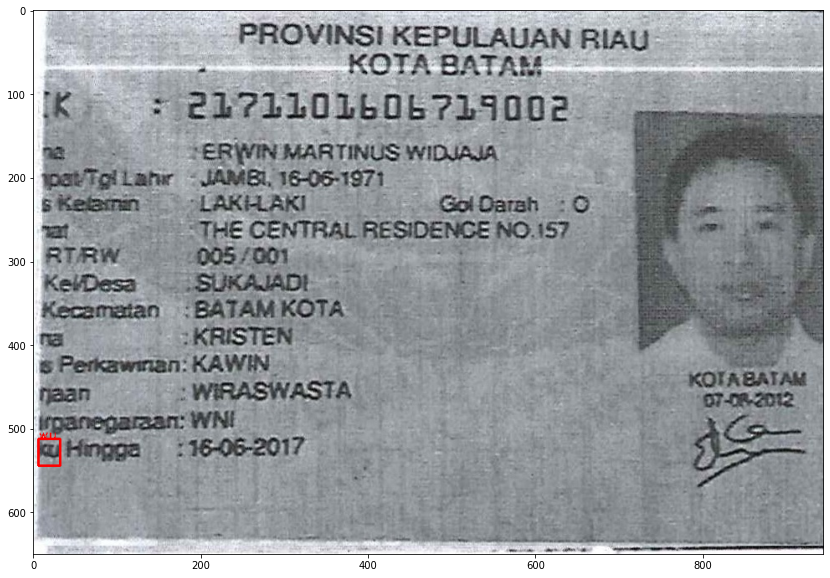

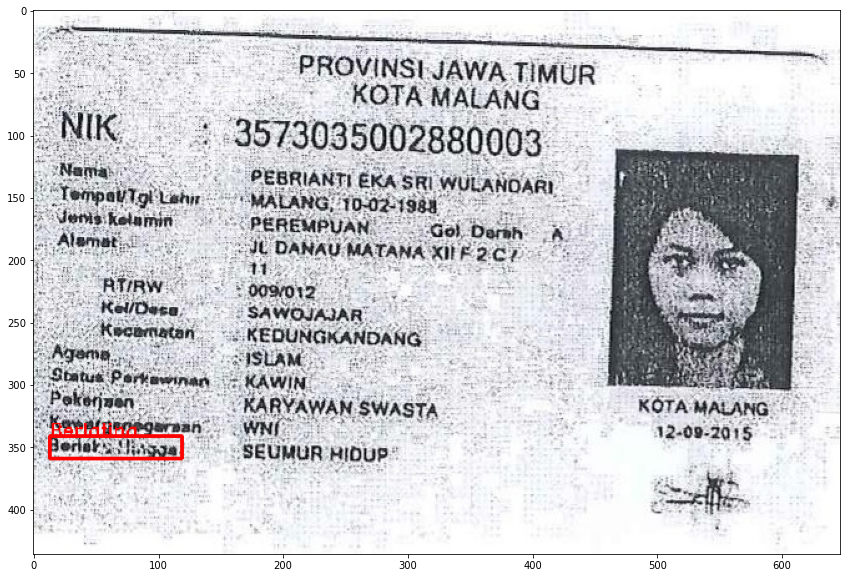

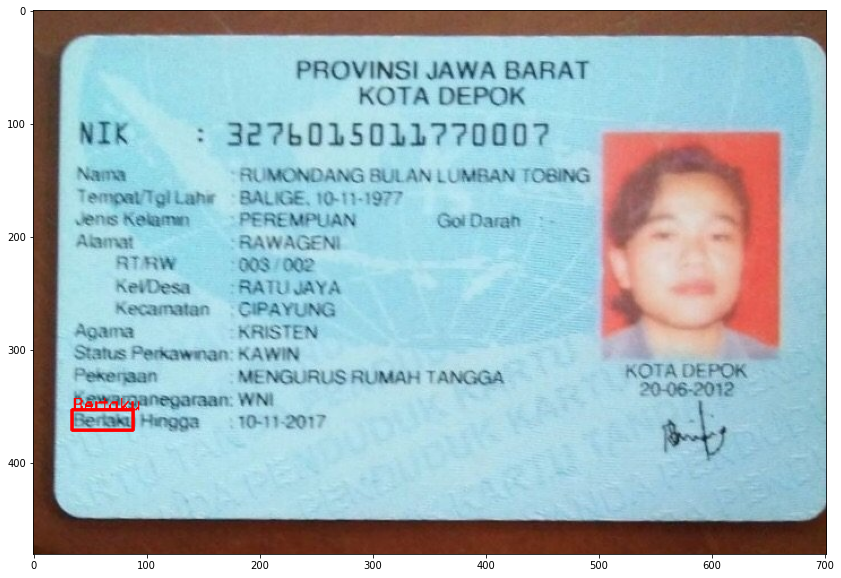

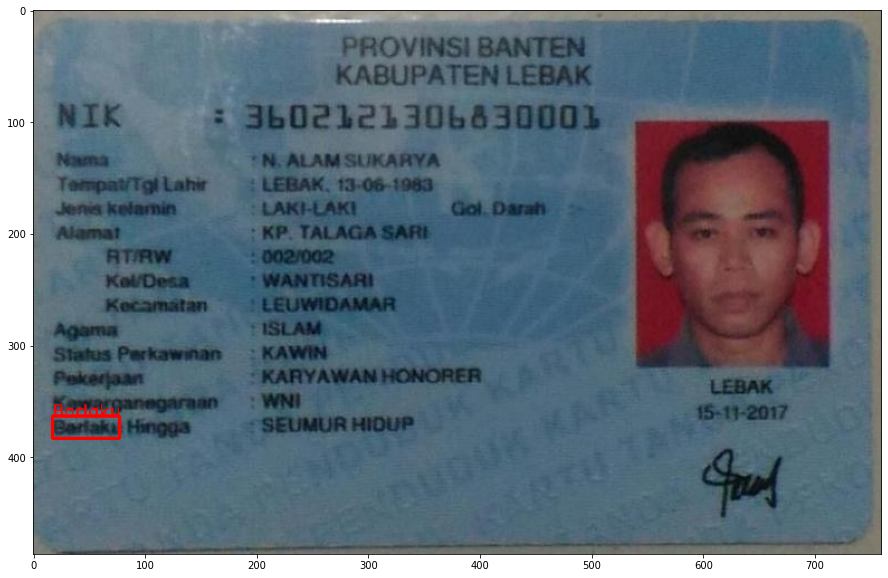

In [18]:
dd = df[(df['tag'] == 14) & ~df['f_berlaku'] & ~(df['text'] == '/')]
print(len(dd))
print(dd)

for name,  group in dd.groupby('file'):
    img = plot_document(dd[dd['file'] ==name])
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR) 
    plt.figure(figsize=(20,10))
    plt.imshow(img[:,:,::-1])
    plt.show()

# Train simple classifier

In [24]:
train, val = train_test_split(df[df['is_first'] == False], test_size=0.2)

In [25]:
train.columns

Index(['file', 'text', 'cx', 'cy', 'w', 'h', 'imgw', 'imgh', 'is_first', 'tag',
       'f_isdigit', 'f_isdate', 'f_iszipcode', 'f_isalpha', 'f_isalnum',
       'f_isnum', 'f_isnumsym', 'f_isnumreal', 'f_nik', 'f_nama', 'f_jenis',
       'f_tempat', 'f_alamat', 'f_rtrw', 'f_keldesa', 'f_kecamatan', 'f_agama',
       'f_status_perkawinan', 'f_pekerjaan', 'f_kewarganegaraan', 'f_berlaku',
       'f_y', 'f_len', 'ncx', 'ncy'],
      dtype='object')

In [26]:
X = train[['f_isdigit', 'f_isdate', 'f_iszipcode', 'f_isalpha', 'f_isalnum',
       'f_isnum', 'f_isnumsym', 'f_isnumreal', 'f_nik', 'f_nama', 'f_jenis',
       'f_tempat', 'f_alamat', 'f_rtrw', 'f_keldesa', 'f_kecamatan', 'f_agama',
       'f_status_perkawinan', 'f_pekerjaan', 'f_kewarganegaraan', 'f_berlaku',
       'f_len', 'ncx', 'ncy']]
y = train['tag']
clf = LinearSVC().fit(X,y)

In [27]:
DATA_DIR

PosixPath('../data/interim/2022-01-06_combined_orc_kyc-key-fields')

In [28]:
with open(DATA_DIR/"ktp_keys.pkl", "wb") as of:
    pickle.dump(clf, of)

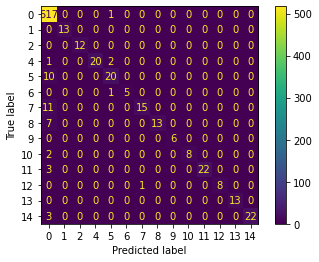

In [29]:
X = val[['f_isdigit', 'f_isdate', 'f_iszipcode', 'f_isalpha', 'f_isalnum',
       'f_isnum', 'f_isnumsym', 'f_isnumreal', 'f_nik', 'f_nama', 'f_jenis',
       'f_tempat', 'f_alamat', 'f_rtrw', 'f_keldesa', 'f_kecamatan', 'f_agama',
       'f_status_perkawinan', 'f_pekerjaan', 'f_kewarganegaraan', 'f_berlaku',
       'f_len', 'ncx', 'ncy']]
y = val['tag']
ypred = clf.predict(X)
ConfusionMatrixDisplay.from_predictions(y, ypred)

In [30]:
clf.intercept_

array([-1.22679989, -0.73650558, -0.72475074, -0.79710863,  0.36424155,
       -0.79370277, -0.28544316, -0.52719491, -1.00975956, -0.92392007,
       -0.98830249, -0.98919946, -1.60543531, -1.24104127])

<BarContainer object of 14 artists>

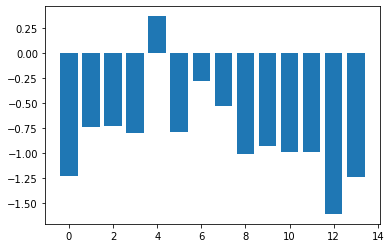

In [31]:
plt.bar(range(len(clf.intercept_)), clf.intercept_)

In [32]:
clf.coef_.shape

(14, 24)

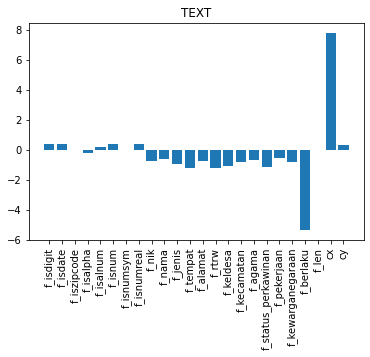

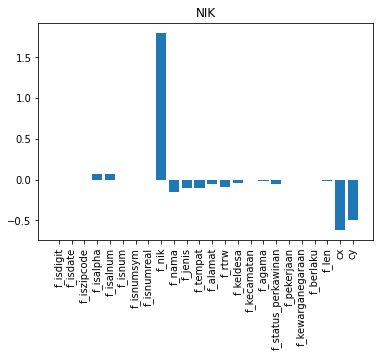

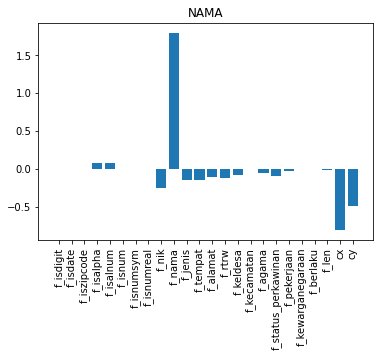

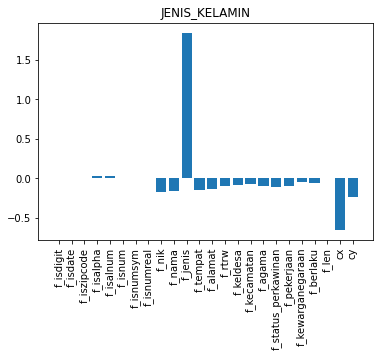

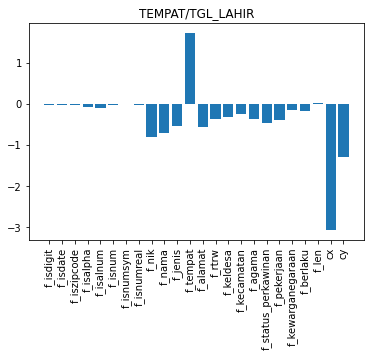

...

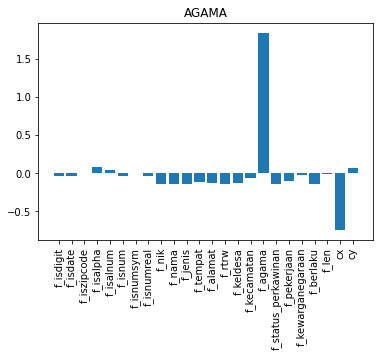

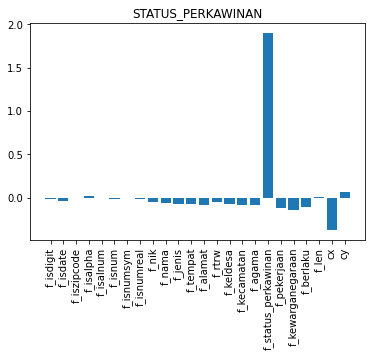

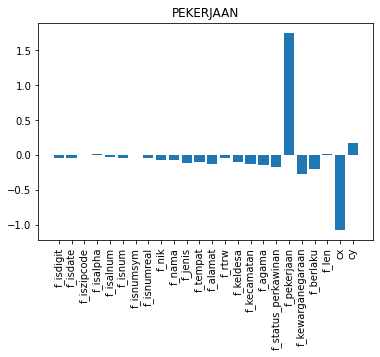

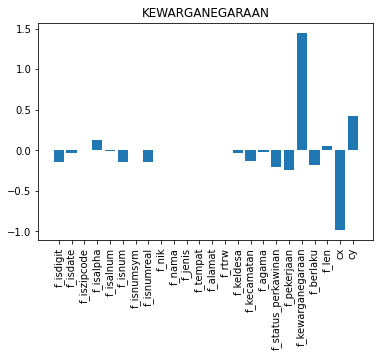

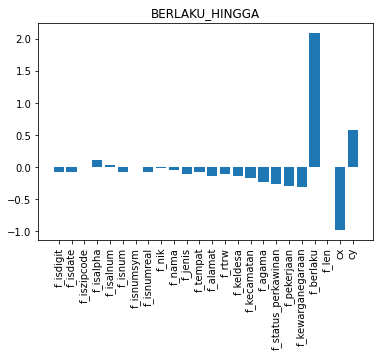

In [33]:
for i,coef in enumerate(clf.coef_):
    plt.bar(range(clf.coef_.shape[1]),coef)
    plt.xticks(range(clf.coef_.shape[1]), labels=['f_isdigit', 'f_isdate', 'f_iszipcode', 'f_isalpha', 'f_isalnum',
       'f_isnum', 'f_isnumsym', 'f_isnumreal', 'f_nik', 'f_nama', 'f_jenis',
       'f_tempat', 'f_alamat', 'f_rtrw', 'f_keldesa', 'f_kecamatan', 'f_agama',
       'f_status_perkawinan', 'f_pekerjaan', 'f_kewarganegaraan', 'f_berlaku',
       'f_len', 'cx', 'cy'], rotation=90)
    plt.title(classes[i if i < 3 else i+1])
    plt.show()
    

no weightage to anything other than the name fields. if its not name it is categorized as other.
there seems to be strong negative weight to cx. need to input normalized cx and would be essential to getting better scores.

# Try using cx cy normalized

create a new dataframe with cx, cy, w, h normalized to the is_first rect. ncx, ncy, nw, nh.

In [34]:
w = h = cx = cy = 0

from collections import defaultdict
rows = defaultdict(list)

for _, rr in df.iterrows():
    file = rr['file']
    if rr['is_first']:
        w = rr['w'] * rr['imgw'] 
        h = rr['h'] * rr['imgh']
        cx = rr['cx'] * rr['imgw']
        cy = rr['cy'] * rr['imgh']
        rows['ncx'].append(rr['cx'] * rr['imgw'] / w)
        rows['ncy'].append(rr['cy'] * rr['imgh'] / h)
        rows['nw'].append(rr['w'] * rr['imgw'] / w)
        rows['nh'].append(rr['h'] * rr['imgh'] / h)
    else:
        rows['ncx'].append(rr['cx'] * rr['imgw'] / w)
        rows['ncy'].append(rr['cy'] * rr['imgh'] / h)
        rows['nw'].append(rr['w'] * rr['imgw'] / w)
        rows['nh'].append(rr['h'] * rr['imgh'] / h)

df['ncx'] = rows['ncx']
df['ncy'] = rows['ncy']
df['nw'] = rows['nw']
df['nh'] = rows['nh']

In [35]:
train.head()

,file,text,cx,cy,w,h,imgw,imgh,is_first,tag,...,f_kecamatan,f_agama,f_status_perkawinan,f_pekerjaan,f_kewarganegaraan,f_berlaku,f_y,f_len,ncx,ncy
733,KTP29.jpeg,SEUMUR,0.332353,0.866983,0.102941,0.038005,680,421,False,0,...,False,False,False,False,False,False,0,6,0.332353,0.866983
1469,KTP33.jpeg,wa,0.688333,0.791349,0.088333,0.061069,600,393,False,0,...,False,False,False,False,False,False,0,2,0.688333,0.791349
1273,KTP18.jpeg,SEUMUR,0.326250,0.774194,0.115000,0.042339,800,496,False,0,...,False,False,False,False,False,False,0,6,0.326250,0.774194
898,KTP12.jpeg,7308232505910001,0.458108,0.187633,0.410811,0.068230,740,469,False,0,...,False,False,False,False,False,False,0,16,0.458108,0.187633
3038,All_KYC_Docs_80a.jpg,:,0.249456,0.658837,0.005076,0.039150,1379,894,False,0,...,False,False,False,False,False,False,0,1,0.249456,0.658837


# Predictions plotting

In [36]:
X = df[['f_isdigit', 'f_isdate', 'f_iszipcode', 'f_isalpha', 'f_isalnum',
       'f_isnum', 'f_isnumsym', 'f_isnumreal', 'f_nik', 'f_nama', 'f_jenis',
       'f_tempat', 'f_alamat', 'f_rtrw', 'f_keldesa', 'f_kecamatan', 'f_agama',
       'f_status_perkawinan', 'f_pekerjaan', 'f_kewarganegaraan', 'f_berlaku',
       'f_len', 'ncx', 'ncy']]
ypred = clf.predict(X)
df['ypred'] = ypred 

KTP2.jpeg


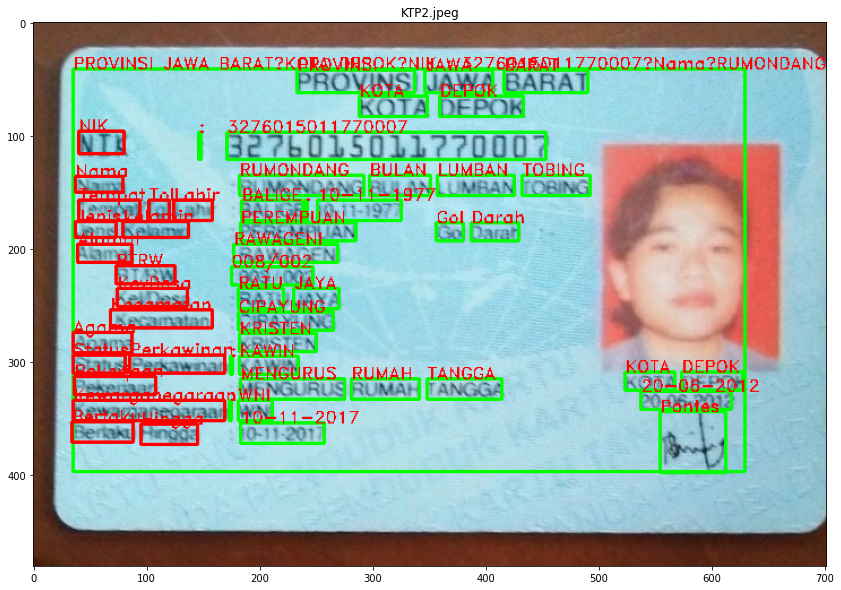

In [37]:
file = df['file'].iloc[random.randint(0, len(df['file']))]
print(file)
# file = "KTP3.jpeg"
plot_figure(df[df['file'] == file], ycol='ypred')

# Value Field Entity Tag

In [38]:
df.groupby('f_y')[['ncx', 'ncy']].describe()

ncx                                                              \
      count      mean       std       min       25%       50%       75%   
f_y                                                                       
0    2794.0  0.463575  0.210512  0.000000  0.321383  0.422222  0.581103   
1      51.0  0.094529  0.048075  0.037333  0.067296  0.081594  0.101017   
2      53.0  0.088738  0.036924  0.041778  0.065315  0.079208  0.098616   
4      99.0  0.127236  0.059734  0.033778  0.070822  0.136026  0.165784   
5     125.0  0.168108  0.067973  0.053173  0.102317  0.169983  0.212785   
6      49.0  0.093122  0.035835  0.045333  0.071837  0.083451  0.102479   
7      88.0  0.161315  0.052457  0.037920  0.125987  0.152786  0.184254   
8      73.0  0.183100  0.082290  0.072589  0.138316  0.166917  0.197917   
9      53.0  0.193753  0.063704  0.085590  0.157219  0.176803  0.209567   
10     49.0  0.091644  0.038518  0.045333  0.066781  0.078462  0.104377   
11    103.0  0.145765  0.071367  0.040889  0.075701  0.158317  0.201577   
12     52.0  0.118007  0.051894  0.064000  0.087313  0.101617  0.128598   
13     52.0  0.163672  0.042176  0.109966  0.136948  0.153773  0.181537   
14     95.0  0.179487  0.169310  0.047423  0.084127  0.161215  0.193174   

                  ncy                                                    \
          max   count      mean       std       min       25%       50%   
f_y                                                                       
0    1.152478  2794.0  0.573593  0.261253  0.040323  0.398305  0.546367   
1    0.312500    51.0  0.261153  0.076964  0.180645  0.218623  0.248000   
2    0.232529    53.0  0.355803  0.079950  0.270968  0.313415  0.341783   
4    0.324015    99.0  0.469404  0.083034  0.369803  0.415667  0.459016   
5    0.383736   125.0  0.410302  0.085030  0.320968  0.364634  0.389401   
6    0.238882    49.0  0.515581  0.083582  0.404826  0.460957  0.510976   
7    0.326557    88.0  0.581365  0.095404  0.442359  0.518201  0.571429   
8    0.538732    73.0  0.634879  0.106813  0.439678  0.562212  0.615584   
9    0.506641    53.0  0.682136  0.099568  0.485255  0.621053  0.664935   
10   0.240152    49.0  0.734030  0.104527  0.516883  0.673684  0.727020   
11   0.363405   103.0  0.772553  0.122532  0.364611  0.709964  0.774373   
12   0.352000    52.0  0.825768  0.123503  0.467532  0.757603  0.826257   
13   0.318933    52.0  0.887485  0.112427  0.641753  0.810155  0.886660   
14   0.952465    95.0  0.941493  0.100161  0.774799  0.873161  0.935780   

                         
          75%       max  
f_y                      
0    0.787501  1.401130  
1    0.279914  0.696798  
2    0.375000  0.792844  
4    0.497449  0.896422  
5    0.427826  0.847458  
6    0.543716  0.943503  
7    0.617691  1.047081  
8    0.669421  1.097928  
9    0.720379  1.145009  
10   0.776859  1.201507  
11   0.827065  1.248587  
12   0.884074  1.301318  
13   0.948107  1.350282  
14   0.991868  1.401130

<AxesSubplot:xlabel='f_y', ylabel='ncx'>

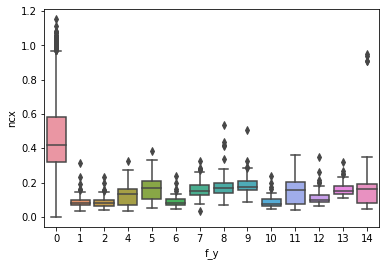

In [39]:
sns.boxplot(x='f_y', y='ncx', data=df)


<AxesSubplot:xlabel='f_y', ylabel='ncy'>

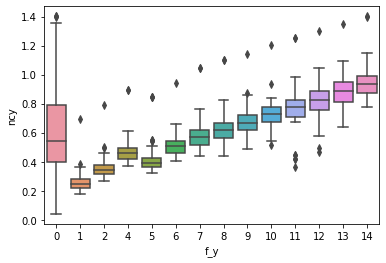

In [40]:
sns.boxplot(x='f_y', y='ncy', data=df)


In [41]:
df.groupby('f_y')[['nw', 'nh']].describe()

nw                                                              \
      count      mean       std       min       25%       50%       75%   
f_y                                                                       
0    2794.0  0.107412  0.154357 -0.410909  0.012076  0.082755  0.131251   
1      51.0  0.077634  0.008056  0.064825  0.070615  0.076571  0.081907   
2      53.0  0.076083  0.008217  0.063768  0.069544  0.074394  0.081283   
4      99.0  0.079538  0.019230  0.048110  0.061904  0.073143  0.098158   
5     125.0  0.065610  0.026167  0.027990  0.036458  0.061514  0.090498   
6      49.0  0.089827  0.008672  0.071310  0.083427  0.087413  0.095685   
7      88.0  0.045334  0.016585  0.027397  0.034698  0.042512  0.046615   
8      73.0  0.070358  0.028348  0.034826  0.046676  0.061620  0.101333   
9      53.0  0.142493  0.013716  0.092979  0.133803  0.141042  0.151515   
10     49.0  0.088422  0.007343  0.069652  0.083930  0.087603  0.092958   
11    103.0  0.111052  0.033021  0.068841  0.078648  0.090776  0.139367   
12     52.0  0.127285  0.011740  0.107246  0.118233  0.123935  0.135285   
13     52.0  0.231767  0.014427  0.194030  0.221546  0.229229  0.244142   
14     95.0  0.091276  0.007277  0.078986  0.085761  0.089770  0.096036   

                   nh                                                    \
          max   count      mean       std       min       25%       50%   
f_y                                                                       
0    1.000000  2794.0  0.070499  0.136543 -0.106583  0.041667  0.047700   
1    0.098976    51.0  0.060907  0.007707  0.042135  0.055521  0.060526   
2    0.096181    53.0  0.042157  0.005757  0.032731  0.038532  0.041899   
4    0.126603    99.0  0.043925  0.006300  0.030864  0.038993  0.042607   
5    0.112457   125.0  0.053295  0.005617  0.040691  0.050328  0.053812   
6    0.108768    49.0  0.041464  0.006663  0.029985  0.037594  0.040590   
7    0.114754    88.0  0.040939  0.003986  0.031484  0.038258  0.041116   
8    0.135338    73.0  0.042232  0.004756  0.031484  0.039216  0.042056   
9    0.180887    53.0  0.044442  0.007092  0.025281  0.040214  0.044000   
10   0.109290    49.0  0.047749  0.004809  0.037037  0.043716  0.048193   
11   0.164074   103.0  0.046285  0.005807  0.034483  0.042048  0.045997   
12   0.158703    52.0  0.049767  0.004978  0.041761  0.045528  0.049451   
13   0.255973    52.0  0.053831  0.006229  0.041979  0.048932  0.053371   
14   0.110057    95.0  0.051564  0.005467  0.040741  0.047644  0.052000   

                         
          75%       max  
f_y                      
0    0.056000  1.000000  
1    0.066268  0.077151  
2    0.044568  0.066667  
4    0.047876  0.058333  
5    0.055556  0.068000  
6    0.044077  0.066667  
7    0.042959  0.052000  
8    0.045181  0.055147  
9    0.047085  0.062500  
10   0.050562  0.057851  
11   0.048499  0.065282  
12   0.052904  0.066116  
13   0.057869  0.079167  
14   0.055409  0.067416

In [739]:
df['v_y'] = 0
ncy_mean = df[df['f_y'] != 0]['nh'].mean()

from functools import partial

def assign_value_fields(df, x):
    if x['f_y'] != 0:
        return 0 #key field
        
    file = x['file']
    res = df[(df['file'] == file) & (df['f_y'] != 0) & (df['ncy'] > x['ncy'] - (ncy_mean*2) ) & (df['ncy'] < x['ncy'] + ncy_mean)] #we allow upper margin (2x), but not lower (0.5). 
    
    if len(res) > 0:
        min_tag = res.iloc[0]['f_y']
        min_dist = 2.0
        
        for _, r in res.iterrows():
            d = math.sqrt((x['ncy']-r['ncy'])**2) #only y distance
            if d < min_dist:
                min_tag = r['f_y']
                min_dist = d
        return min_tag
        
    return 0

df['v_y'] = df.apply(partial(assign_value_fields, df), axis=1)

In [792]:
def plot_document(df, ycol='tag'):
    hsv = plt.get_cmap('hsv')
    colors = hsv(np.linspace(0, 1.0, len(classes)))

    REC = df.iloc[0]['file']
    img = cv2.imread(str(DATA_DIR/FILE_TYPE/REC))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    scale = 2
    img2 = cv2.resize(img, (img.shape[1] * scale, img.shape[0] * scale))
    img = np.ones((img2.shape), dtype=img.dtype) * 255

    img = cv2.addWeighted(img, 0.5, img2, 0.5, 0.0)
    
    for ix,rr in df.iterrows():
        
        label = f"{classes[rr['v_y2']] if rr['f_y'] == 0 else rr['text']}"
        label = label if len(rr['text']) > 1 else ''
        cx = int(rr['cx']* img.shape[1])
        cy = int(rr['cy']* img.shape[0])
        w = int(rr['w'] * img.shape[1])
        h = int(rr['h'] * img.shape[0])

        color = (0,200,0,255) if rr['f_y'] == 0 else (20,120,20,255)
        plot_label(img, label, cx, cy, w, h, color)

    return img

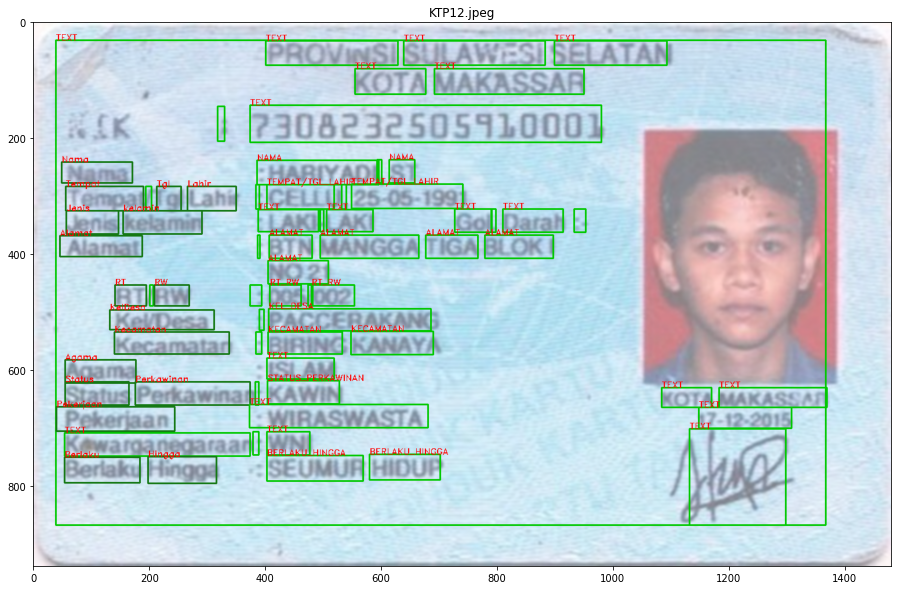

In [795]:

file = df['file'].iloc[random.randint(0, len(df['file']))]
# print(file)
# file = "KTP24.jpeg"
plot_figure(df[df['file'] == file])

In [440]:
Path("/tmp/vy").mkdir(exist_ok=True)
for name,  group in df.groupby('file'):
    img = plot_document(df[df['file'] ==name])
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR) 
    cv2.imwrite( "/tmp/vy/" + name, img)

Its not psosible to tweak this. manually annotate and edit the dataset from here. this shoudl provide good seed.

## Manually tweak and train network

In [428]:
df.to_csv(DATA_DIR/"ktp_vf_raw.csv")

In [530]:
dv = pd.read_csv(DATA_DIR/"ktp_vf.csv")

 
dv = dv[dv['file'].isin([
    'KTP35.jpeg', 'KTP22.jpeg', 'KTP8.jpeg', 'KTP24.jpeg', 'KTP11.jpeg', 'KTP16.jpeg', 
    'KTP12.jpeg', 'KTP6.jpeg', 'KTP29.jpeg', 'KTP32.jpeg', 'KTP28.jpeg', 'KTP30.jpeg', 
    'KTP20.jpeg', 'KTP4.jpeg', 'KTP1.jpeg', 'KTP34.jpeg', 'KTP27.jpeg', 'KTP5.jpeg', 'KTP39.jpeg', 
    'KTP3.jpeg', 'KTP14.jpeg', 'KTP37.jpeg', 'KTP13.jpeg', 'KTP33.jpeg', 'KTP17.jpeg', 'KTP2.jpeg', 
    'KTP41.jpeg', 'KTP26.jpeg', 'KTP25.jpeg', 'KTP18.jpeg', 'KTP9.jpeg', 'KTP7.jpeg', 'KTP21.jpeg', 'KTP38.jpeg',
])]
dv = dv[~(dv['file'].isin(['KTP35.jpeg', 'KTP29.jpeg', 'KTP1.jpeg', 'KPT33.jpeg']))] #invalid files. 

In [531]:
dv.columns

Index(['Unnamed: 0', 'file', 'text', 'cx', 'cy', 'w', 'h', 'imgw', 'imgh',
       'is_first', 'tag', 'f_isdigit', 'f_isdate', 'f_iszipcode', 'f_isalpha',
       'f_isalnum', 'f_isnum', 'f_isnumsym', 'f_isnumreal', 'f_nik', 'f_nama',
       'f_jenis', 'f_tempat', 'f_alamat', 'f_rtrw', 'f_keldesa', 'f_kecamatan',
       'f_agama', 'f_status_perkawinan', 'f_pekerjaan', 'f_kewarganegaraan',
       'f_berlaku', 'f_len', 'f_y', 'ncx', 'ncy', 'nw', 'nh', 'ypred', 'v_y',
       'Unnamed: 40'],
      dtype='object')

In [532]:
classes

['TEXT',
 'NIK',
 'NAMA',
 'TEXTUNUSED',
 'JENIS_KELAMIN',
 'TEMPAT/TGL_LAHIR',
 'ALAMAT',
 'RT_RW',
 'KEL_DESA',
 'KECAMATAN',
 'AGAMA',
 'STATUS_PERKAWINAN',
 'PEKERJAAN',
 'KEWARGANEGARAAN',
 'BERLAKU_HINGGA']

In [533]:
def rtheta_field(df, fy, x):
    dfy = df[df['f_y'] == fy]
    if len(dfy) > 0:
        ff = dfy.iloc[0]
        cx = ff['ncx']
        cy = ff['ncy']
        
        xx = x['ncx']
        xy = x['ncy']
        
        d = math.sqrt(((xx-cx)**2) + ((xy-cy)**2))
        t = math.atan2((xy-cy),(xx-cx))
        return (d,t)
    return (0.0, 0.0)

def rtheta_field_r(df, fy, x):
    d, t = rtheta_field(df, fy, x)
    return d

def rtheta_field_t(df, fy, x):
    d, t = rtheta_field(df, fy, x)
    return t

dv['v_nik_r'] = dv.apply(partial(rtheta_field_r, dv, 1), axis=1)
dv['v_nik_t'] = dv.apply(partial(rtheta_field_t, dv, 1), axis=1)
dv['v_nama_r'] = dv.apply(partial(rtheta_field_r, dv, 2), axis=1)
dv['v_nama_t'] = dv.apply(partial(rtheta_field_t, dv, 2), axis=1)
dv['v_jenis_r'] = dv.apply(partial(rtheta_field_r, dv, 4), axis=1)
dv['v_jenis_t'] = dv.apply(partial(rtheta_field_t, dv, 4), axis=1)
dv['v_tempat_r'] = dv.apply(partial(rtheta_field_r, dv, 5), axis=1)
dv['v_tempat_t'] = dv.apply(partial(rtheta_field_t, dv, 5), axis=1)
dv['v_alamat_r'] = dv.apply(partial(rtheta_field_r, dv, 6), axis=1)
dv['v_alamat_t'] = dv.apply(partial(rtheta_field_t, dv, 6), axis=1)
dv['v_rtrw_r'] = dv.apply(partial(rtheta_field_r, dv, 7), axis=1)
dv['v_rtrw_t'] = dv.apply(partial(rtheta_field_t, dv, 7), axis=1)
dv['v_keldesa_r'] = dv.apply(partial(rtheta_field_r, dv, 8), axis=1)
dv['v_keldesa_t'] = dv.apply(partial(rtheta_field_t, dv, 8), axis=1)
dv['v_kecamatan_r'] = dv.apply(partial(rtheta_field_r, dv, 9), axis=1)
dv['v_kecamatan_t'] = dv.apply(partial(rtheta_field_t, dv, 9), axis=1)
dv['v_agama_r'] = dv.apply(partial(rtheta_field_r, dv, 10), axis=1)
dv['v_agama_t'] = dv.apply(partial(rtheta_field_t, dv, 10), axis=1)
dv['v_status_perkawinan_r'] = dv.apply(partial(rtheta_field_r, dv, 11), axis=1)
dv['v_status_perkawinan_t'] = dv.apply(partial(rtheta_field_t, dv, 11), axis=1)
dv['v_pekerjaan_r'] = dv.apply(partial(rtheta_field_r, dv, 12), axis=1)
dv['v_pekerjaan_t'] = dv.apply(partial(rtheta_field_t, dv, 12), axis=1)
dv['v_kewarganegaraan_t'] = dv.apply(partial(rtheta_field_r, dv, 13), axis=1)
dv['v_kewarganegaraan_r'] = dv.apply(partial(rtheta_field_t, dv, 13), axis=1)
dv['v_berlaku_t'] = dv.apply(partial(rtheta_field_r, dv, 14), axis=1)
dv['v_berlaku_r'] = dv.apply(partial(rtheta_field_t, dv, 14), axis=1)


dv

,Unnamed: 0,file,text,cx,cy,w,h,imgw,imgh,is_first,...,v_agama_r,v_agama_t,v_status_perkawinan_r,v_status_perkawinan_t,v_pekerjaan_r,v_pekerjaan_t,v_kewarganegaraan_t,v_kewarganegaraan_r,v_berlaku_t,v_berlaku_r
63,63,KTP22.jpeg,PROVINSI BANTEN\nKABUPATEN TANGERANG\nNIK : 36...,0.459916,0.422442,0.879747,0.782178,474.0,303,True,...,0.515389,-0.476265,0.544756,-0.563844,0.562237,-0.682060,0.567369,-0.816577,0.650086,-0.804451
64,64,KTP22.jpeg,PROVINSI,0.424051,0.059406,0.154008,0.052805,474.0,303,False,...,0.815293,-1.033518,0.864035,-1.063630,0.909184,-1.120528,0.944011,-1.193568,1.018673,-1.156490
65,65,KTP22.jpeg,BANTEN,0.582279,0.059406,0.132911,0.052805,474.0,303,False,...,0.920405,-0.864842,0.964295,-0.899861,1.000647,-0.957988,1.024005,-1.029543,1.103427,-1.006724
66,66,KTP22.jpeg,KABUPATEN,0.386076,0.115512,0.196203,0.056106,474.0,303,False,...,0.731577,-1.034027,0.780374,-1.067336,0.825852,-1.129786,0.861534,-1.209481,0.935696,-1.167860
67,67,KTP22.jpeg,TANGERANG,0.605485,0.115512,0.210970,0.056106,474.0,303,False,...,0.885442,-0.789543,0.926813,-0.829392,0.959202,-0.892433,0.977934,-0.968597,1.058651,-0.949410
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2272,2399,KTP38.jpeg,WNI,0.293542,0.713846,0.043053,0.030769,511.0,325,False,...,0.312361,0.506853,0.291992,0.337824,0.253726,0.132360,0.205147,-0.125048,0.277796,-0.293768
2273,2400,KTP38.jpeg,SEUMUR,0.320939,0.763077,0.095890,0.040000,511.0,325,False,...,0.373215,0.615981,0.346569,0.482403,0.299356,0.331699,0.238195,0.161977,0.297881,-0.055214
2274,2401,KTP38.jpeg,HIDUP,0.416830,0.756923,0.072407,0.040000,511.0,325,False,...,0.464025,0.463914,0.444462,0.350890,0.403448,0.223661,0.346773,0.087817,0.408519,-0.059859
2275,2402,KTP38.jpeg,MIMIKA,0.839530,0.676923,0.088063,0.030769,511.0,325,False,...,0.907405,0.114453,0.905181,0.053912,0.880005,-0.016495,0.835172,-0.088224,0.903450,-0.142648


In [534]:
df['f_len'] = df.apply(lambda x: len(x['text']), axis=1).astype(int)

In [543]:
dv['cx'] = dv['cx'].astype(np.float32)
dv['cy'] = dv['cy'].astype(np.float32)
dv['w'] = dv['w'].astype(np.float32)
dv['h'] = dv['h'].astype(np.float32)
dv['is_first'] = dv['is_first'].astype(bool)
dv['f_isdigit'] = dv['f_isdigit'].astype(bool)
dv['f_isdate'] = dv['f_isdate'].astype(bool)
dv['f_iszipcode'] = dv['f_iszipcode'].astype(bool)
dv['f_isalpha'] = dv['f_isalpha'].astype(bool)
dv['f_isalnum'] = dv['f_isalnum'].astype(bool)
dv['f_isnum'] = dv['f_isnum'].astype(bool)
dv['f_isnumsym'] = dv['f_isnumsym'].astype(bool)
dv['f_isnumreal'] = dv['f_isnumreal'].astype(bool)

X = dv[['f_isdigit', 'f_isdate', 'f_iszipcode', 'f_isalpha', 'f_isalnum',
       'f_isnum', 'f_isnumsym', 'f_isnumreal',
       'ncx', 'ncy', 'v_nik_r', 'v_nik_t', 'v_nama_r', 'v_nama_t',
       'v_jenis_r', 'v_jenis_t', 'v_tempat_r', 'v_tempat_t', 'v_alamat_r',
       'v_alamat_t', 'v_rtrw_r', 'v_rtrw_t', 'v_keldesa_r', 'v_keldesa_t',
       'v_kecamatan_r', 'v_kecamatan_t', 'v_agama_r', 'v_agama_t',
       'v_status_perkawinan_r', 'v_status_perkawinan_t', 'v_pekerjaan_r',
       'v_pekerjaan_t', 'v_kewarganegaraan_t', 'v_kewarganegaraan_r',
       'v_berlaku_t', 'v_berlaku_r']]
y = dv['v_y'].astype(np.int)
clf = LinearSVC().fit(X,y)

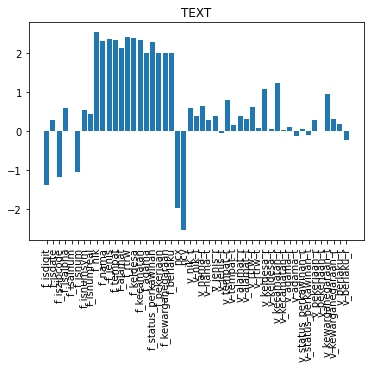

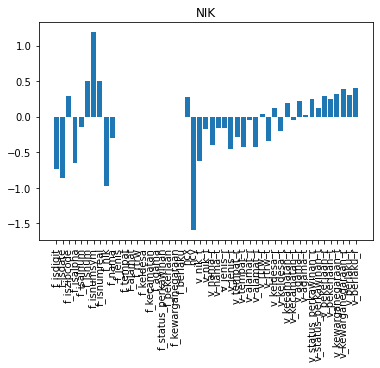

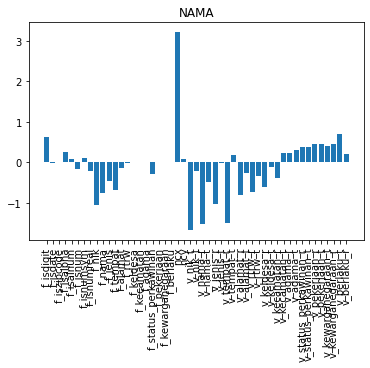

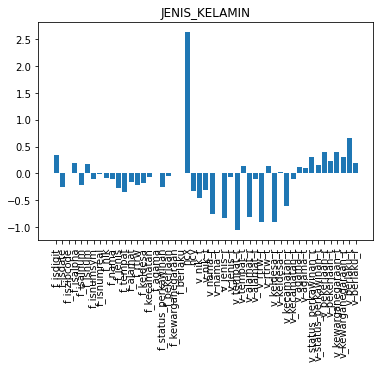

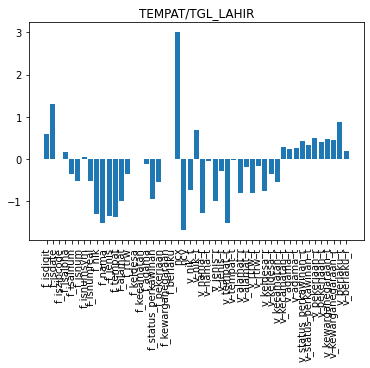

...

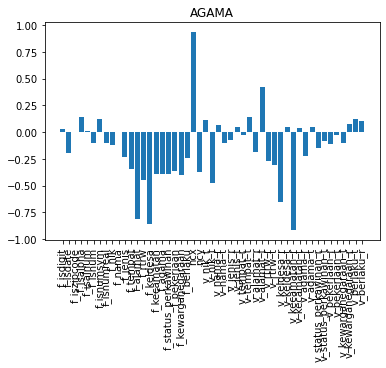

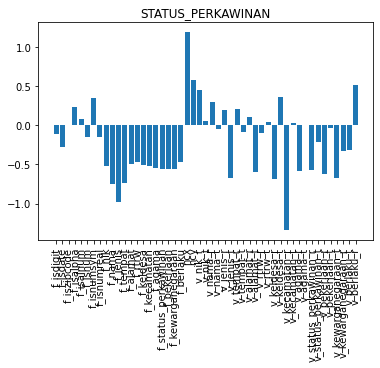

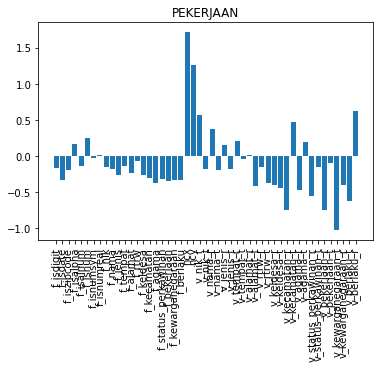

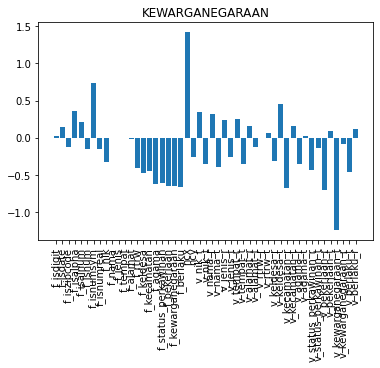

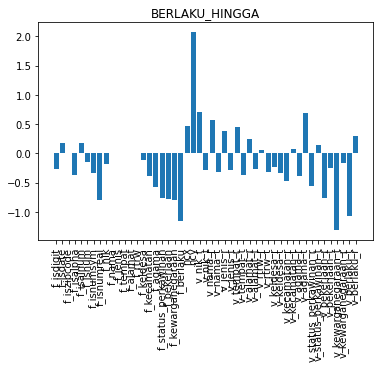

In [536]:
for i,coef in enumerate(clf.coef_):
    plt.bar(range(clf.coef_.shape[1]),coef)
    plt.xticks(range(clf.coef_.shape[1]), labels=['f_isdigit', 'f_isdate', 'f_iszipcode', 'f_isalpha', 'f_isalnum',
       'f_isnum', 'f_isnumsym', 'f_isnumreal', 
       'ncx', 'ncy', 'v_nik_r', 'v_nik_t', 'v_nama_r', 'v_nama_t',
       'v_jenis_r', 'v_jenis_t', 'v_tempat_r', 'v_tempat_t', 'v_alamat_r',
       'v_alamat_t', 'v_rtrw_r', 'v_rtrw_t', 'v_keldesa_r', 'v_keldesa_t',
       'v_kecamatan_r', 'v_kecamatan_t', 'v_agama_r', 'v_agama_t',
       'v_status_perkawinan_r', 'v_status_perkawinan_t', 'v_pekerjaan_r',
       'v_pekerjaan_t', 'v_kewarganegaraan_t', 'v_kewarganegaraan_r',
       'v_berlaku_t', 'v_berlaku_r'], rotation=90)
    plt.title(classes[i if i < 3 else i+1])
    plt.show()

In [510]:
import pickle

In [537]:
pickle.dump(clf, open("value_fields_linear.pkl", "wb"))

## Create dv for all remaining files

In [513]:
len(df)

3736

In [726]:
def rtheta_field(df, fy, x):
    dfy = df[df['f_y'] == fy]
    if len(dfy) > 0:
        ff = dfy.iloc[0]
        cx = ff['ncx']
        cy = ff['ncy']
        
        xx = x['ncx']
        xy = x['ncy']
        
        d = math.sqrt(((xx-cx)**2) + ((xy-cy)**2))
        t = math.atan2((xy-cy),(xx-cx))
        return (d,t)
    return (0.0, 0.0)

def rtheta_field_r(df, fy, x):
    d, t = rtheta_field(df, fy, x)
    return d

def rtheta_field_t(df, fy, x):
    d, t = rtheta_field(df, fy, x)
    return t

df['v_nik_r'] = df.apply(partial(rtheta_field_r, df, 1), axis=1)
df['v_nik_t'] = df.apply(partial(rtheta_field_t, df, 1), axis=1)
df['v_nama_r'] = df.apply(partial(rtheta_field_r, df, 2), axis=1)
df['v_nama_t'] = df.apply(partial(rtheta_field_t, df, 2), axis=1)
df['v_jenis_r'] = df.apply(partial(rtheta_field_r, df, 4), axis=1)
df['v_jenis_t'] = df.apply(partial(rtheta_field_t, df, 4), axis=1)
df['v_tempat_r'] = df.apply(partial(rtheta_field_r, df, 5), axis=1)
df['v_tempat_t'] = df.apply(partial(rtheta_field_t, df, 5), axis=1)
df['v_alamat_r'] = df.apply(partial(rtheta_field_r, df, 6), axis=1)
df['v_alamat_t'] = df.apply(partial(rtheta_field_t, df, 6), axis=1)
df['v_rtrw_r'] = df.apply(partial(rtheta_field_r, df, 7), axis=1)
df['v_rtrw_t'] = df.apply(partial(rtheta_field_t, df, 7), axis=1)
df['v_keldesa_r'] = df.apply(partial(rtheta_field_r, df, 8), axis=1)
df['v_keldesa_t'] = df.apply(partial(rtheta_field_t, df, 8), axis=1)
df['v_kecamatan_r'] = df.apply(partial(rtheta_field_r, df, 9), axis=1)
df['v_kecamatan_t'] = df.apply(partial(rtheta_field_t, df, 9), axis=1)
df['v_agama_r'] = df.apply(partial(rtheta_field_r, df, 10), axis=1)
df['v_agama_t'] = df.apply(partial(rtheta_field_t, df, 10), axis=1)
df['v_status_perkawinan_r'] = df.apply(partial(rtheta_field_r, df, 11), axis=1)
df['v_status_perkawinan_t'] = df.apply(partial(rtheta_field_t, df, 11), axis=1)
df['v_pekerjaan_r'] = df.apply(partial(rtheta_field_r, df, 12), axis=1)
df['v_pekerjaan_t'] = df.apply(partial(rtheta_field_t, df, 12), axis=1)
df['v_kewarganegaraan_t'] = df.apply(partial(rtheta_field_r, df, 13), axis=1)
df['v_kewarganegaraan_r'] = df.apply(partial(rtheta_field_t, df, 13), axis=1)
df['v_berlaku_t'] = df.apply(partial(rtheta_field_r, df, 14), axis=1)
df['v_berlaku_r'] = df.apply(partial(rtheta_field_t, df, 14), axis=1)


df

,file,text,cx,cy,w,h,imgw,imgh,is_first,tag,...,v_agama_t,v_status_perkawinan_r,v_status_perkawinan_t,v_pekerjaan_r,v_pekerjaan_t,v_kewarganegaraan_t,v_kewarganegaraan_r,v_berlaku_t,v_berlaku_r,f_issym
0,KTP35.jpeg,KARTU TANDA PENDUDUK\nREPUBLIK INDONESIA\nNo. ...,0.482812,0.484185,0.887500,0.907543,640,411,True,0,...,-0.193097,0.487913,0.353485,0.433466,-0.099122,0.404877,-0.337452,0.474396,-2.608012,False
1,KTP35.jpeg,KARTU,0.365625,0.058394,0.150000,0.055961,640,411,False,0,...,-1.049260,0.442995,-0.744786,0.593117,-1.041860,0.652971,-1.177900,0.892681,-2.221154,False
2,KTP35.jpeg,TANDA,0.529688,0.058394,0.146875,0.055961,640,411,False,0,...,-0.834618,0.592314,-0.531632,0.704710,-0.813406,0.743622,-0.946181,0.794495,-2.034901,False
3,KTP35.jpeg,PENDUDUK,0.737500,0.058394,0.242188,0.055961,640,411,False,0,...,-0.646147,0.802973,-0.383259,0.882145,-0.619314,0.900806,-0.733726,0.720767,-1.740146,False
4,KTP35.jpeg,REPUBLIK,0.445312,0.124088,0.221875,0.053528,640,411,False,0,...,-0.869007,0.473883,-0.501662,0.587115,-0.846370,0.630268,-1.001407,0.781196,-2.185775,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6470,KTP19.png,4,0.584661,0.715409,0.010956,0.075472,1004,636,False,0,...,0.370577,0.710210,0.712285,0.570039,0.458639,0.489164,0.335860,0.333064,2.978801,False
6471,KTP19.png,MINAHASA,0.785857,0.698113,0.127490,0.034591,1004,636,False,0,...,0.245015,0.873534,0.533362,0.762074,0.309805,0.691073,0.205744,0.118942,2.852183,False
6472,KTP19.png,SELATAN,0.910359,0.698113,0.105578,0.034591,1004,636,False,0,...,0.209180,0.990226,0.465104,0.889510,0.264260,0.821557,0.172705,0.038823,1.064048,False
6473,KTP19.png,10-06-2015,0.846614,0.742138,0.123506,0.034591,1004,636,False,0,...,0.284931,0.955348,0.544834,0.839856,0.344116,0.765829,0.253661,0.098151,2.095513,False


In [727]:
df['f_len'] = df.apply(lambda x: len(x['text']), axis=1).astype(int)
df['cx'] = df['cx'].astype(np.float32)
df['cy'] = df['cy'].astype(np.float32)
df['w'] = df['w'].astype(np.float32)
df['h'] = df['h'].astype(np.float32)
df['is_first'] = df['is_first'].astype(bool)
df['f_isdigit'] = df['f_isdigit'].astype(bool)
df['f_isdate'] = df['f_isdate'].astype(bool)
df['f_iszipcode'] = df['f_iszipcode'].astype(bool)
df['f_isalpha'] = df['f_isalpha'].astype(bool)
df['f_isalnum'] = df['f_isalnum'].astype(bool)
df['f_isnum'] = df['f_isnum'].astype(bool)
df['f_isnumsym'] = df['f_isnumsym'].astype(bool)
df['f_isnumreal'] = df['f_isnumreal'].astype(bool)

In [728]:
X = df[['f_isdigit', 'f_isdate', 'f_iszipcode', 'f_isalpha', 'f_isalnum',
       'f_isnum', 'f_isnumsym', 'f_isnumreal',
       'ncx', 'ncy', 'v_nik_r', 'v_nik_t', 'v_nama_r', 'v_nama_t',
       'v_jenis_r', 'v_jenis_t', 'v_tempat_r', 'v_tempat_t', 'v_alamat_r',
       'v_alamat_t', 'v_rtrw_r', 'v_rtrw_t', 'v_keldesa_r', 'v_keldesa_t',
       'v_kecamatan_r', 'v_kecamatan_t', 'v_agama_r', 'v_agama_t',
       'v_status_perkawinan_r', 'v_status_perkawinan_t', 'v_pekerjaan_r',
       'v_pekerjaan_t', 'v_kewarganegaraan_t', 'v_kewarganegaraan_r',
       'v_berlaku_t', 'v_berlaku_r']]
df['v_y'] = clf.predict(X)

ValueError: X has 36 features, but LinearSVC is expecting 24 features as input.

In [ ]:
file = df['file'].iloc[random.randint(0, len(df['file']))]
print(file)
file = "202106100907_13a.jpg"
plot_figure(df[df['file'] == file])

## Expert system value field annotations.

the annotations are very close. so will manually tweak it to classify all fields from here. after that leverage it to train network maybe.


1. remove gol darah from annotation
2. remove far right signatures from annotation , signature, issue date etc at bottom right. 
3. assign only berlaku hingga as signgle field


In [742]:
df['f_issym'] = df.apply(lambda x: bool(re.search('^[.,:;!?()\/]+$', x['text'])), axis=1)

In [828]:
%%time 

def postprocess(dg, x):
    vy = x['v_y']
    file = x['file']
    
    if vy == 0:
        return 0 
    
    single_value = False #vy in [1, 4, 10, 12]

    dk = dg[(dg['file'] == file) & (dg['f_y'] == vy)]    
    if len(dk) == 0:
        return 0 #there is no key field. we can't match this to anything.
    
    key = dk.iloc[0]

    #VALUE
    dx = dg[(dg['f_y'] == 0) & (dg['v_y'] == vy) & (~dg['is_first'])] 

    c = vy 

    if c == 1: #NIK
        dx = dx[~dx['f_issym']]  
    elif c == 2: #NAMA
        dx = dx[~dx['f_issym']]
    elif c == 4: #JENIS
        #dx = dx[dx['f_isalpha']]
        dx = dx[~(dx['text'] == 'Gol') & ~(dx['text'] == 'Darah')]
    elif c == 5: #TEMPAT
        dx = dx[dx['f_isalpha'] | dx['f_isdate']]
    elif c == 7: #RTRW
        dx = dx[~(dx['text'] == ':')]
        dx = dx[dx['f_isdigit'] | dx['f_issym']]
    elif c == 10: #AGAMA
        dx = dx[~(dx['text'] == ':')]
        dx = dx[dx['f_isalpha']]
    elif c == 11: #STATUS_PERKAWINAN
        dx = dx[~(dx['text'] == ':')]
        dx = dx[dx['ncx'] < 0.6]
    elif c == 12: #PEKERJAAN
        dx = dx[dx['f_isalpha']]
        dx = dx[dx['ncx'] < 0.6]
    elif c == 13: #KEWARGANEGARAAN
        dx = dx[dx['f_isalpha']] 
    elif c == 14: #BERLAKU
        dx = dx[dx['ncx'] < 0.6]
        dx = dx[dx['f_isdate'] | (dx['text'] == 'SEUMUR') | (dx['text'] == 'HIDUP')]

    if len(dx) > 0:
        if single_value:
            idx = closest_one(dx, (key['ncx'], key['ncy']))
            return c if x.index.equals(idx)  else 0
        else:
            return c if x.name in dx.index else 0
    return 0
            
df['v_y2'] = df.apply(partial(postprocess, df), axis=1)
# df['v_y2'] = df['v_y']

CPU times: user 3.95 s, sys: 0 ns, total: 3.95 s
Wall time: 3.95 s


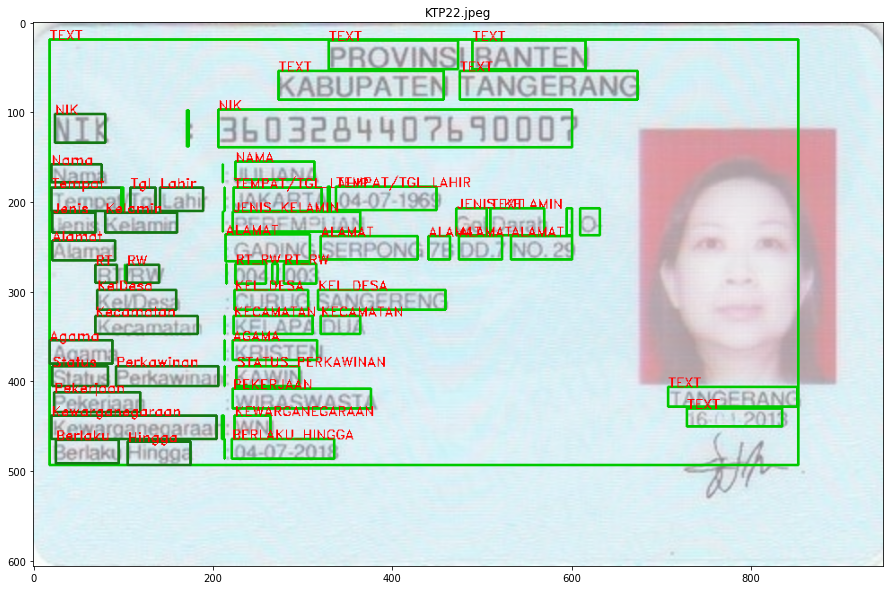

In [842]:
file = df['file'].iloc[random.randint(0, len(df['file']))]
# print(file)
# file = "KTP24.jpeg"
plot_figure(df[df['file'] == file])

# Making into inference module

In [857]:
def bboxs_for_file(file):
    base = os.path.basename(file).split('.')[0]
    yolo_file = DATA_DIR/FILE_TYPE / (base + ".txt")
    json_file = DATA_DIR/FILE_TYPE/ (base + ".json")

    if not os.path.exists(yolo_file):
        print(f"{yolo_file} does not exist")
        return []

    if not os.path.exists(json_file):
        print(f"{json_file} does not exist")
        return []

    yolo = None 
    with open(yolo_file, "r") as of:
        yolo = of.read().split('\n')
    yolo_bboxs = [l.split(' ') for l in yolo if len(l)>0]

    text_response = None 
    with open(json_file, "r") as of:
        text_response = json.load(of)


    imgw, imgh = text_response['fullTextAnnotation']['pages'][0]['width'], text_response['fullTextAnnotation']['pages'][0]['height']
    bboxs = []

    if ('textAnnotations' in text_response):
        for i,text in enumerate(text_response['textAnnotations']):
            boxes = {}
        
            x1 = text['boundingPoly']['vertices'][0].get('x',0)
            y1 = text['boundingPoly']['vertices'][0].get('y',0)
            x2 = text['boundingPoly']['vertices'][1].get('x',0)
            y2 = text['boundingPoly']['vertices'][1].get('y',0)
            x3 = text['boundingPoly']['vertices'][2].get('x',0)
            y3 = text['boundingPoly']['vertices'][2].get('y',0)
            x4 = text['boundingPoly']['vertices'][3].get('x',0)
            y4 = text['boundingPoly']['vertices'][3].get('y',0)
            

            xmin = min(x1, x4)
            xmax = max(x2, x3)
            cx = (xmax + xmin) // 2

            ymin = min(y1, y2)
            ymax = max(y3, y4)
            cy = (ymax + ymin) // 2

            center = ( cx/imgw , cy/imgh )
            width = (x2-x1)/imgw
            height = (y3-y2)/imgh

            #doublecheck the box assignment
            tag = 0
            for yolo_b in yolo_bboxs:
                if (abs(float(center[0])-float(yolo_b[1])) < 5e-3) and (abs(float(center[1])-float(yolo_b[2])) < 5e-3):
                    tag = int(yolo_b[0])
                    break

            # if base == 'KTP3' and text['description'] == 'Berlaku':
            #     print()
            #     print(text['description'], tag)
            #     print(center)
            #     print(width, height)
            #     print(x1, y1, x2,y2, x3,y3, x4,y4)
            #     print(yolo_bboxs)

            
            bboxs.append((text['description'], *center, width, height, imgw, imgh, i==0, tag))
    return bboxs

def load_df(DATA_DIR, FILE_TYPE):
    files = glob.glob(str(DATA_DIR/FILE_TYPE/"*.jpeg")) + glob.glob(str(DATA_DIR/FILE_TYPE/"*.jpg")) + glob.glob(str(DATA_DIR/FILE_TYPE/"*.webp")) + glob.glob(str(DATA_DIR/FILE_TYPE/"*.png")) 
    rows = []

    bboxs_all = []
    for f in files: 
        bboxs = bboxs_for_file(f)
        bboxs_all.extend([(os.path.basename(f), *bb) for bb in bboxs])
        
    df = pd.DataFrame(bboxs_all, columns=['file', 'text', 'cx', 'cy', 'w', 'h', 'imgw', 'imgh', 'is_first', 'tag'])
    df['cx'] = df['cx'].astype(np.float32)
    df['cy'] = df['cy'].astype(np.float32)
    df['w'] = df['w'].astype(np.float32)
    df['h'] = df['h'].astype(np.float32)
    df['is_first'] = df['is_first'].astype(bool)
    df['tag'] = df['tag'].astype(np.int)


    df = df[~((df['file'] == '202106100904_0.jpg') | (df['file'] == '202106100904_16.jpg')| (df['file'] == 'STNK9.jpeg')) ] #stnk
    df = df[~(df['file'].str.contains('denoising') | (df['file'] == 'All_KYC_Docs_50.jpg'))] #blurry docs
    df = df[~(df['file'] == '202106100907_0a.jpg')]
    
    #manual inspection removing invalid ones 
    df = df[~(df['file'].isin(['202106100909_2.jpg', '202106100912_12a.jpg', '202106100918_0a.jpg', 
                     '202106100918_4.jpg', '202106100918_9a.jpg', '202106100923_1a.jpg', 
                     '202106100924_0.jpg', '202106100924_3a.jpg', '202106100925_0.jpg', 
                     'All_KYC_Docs_105b.jpg', 'All_KYC_Docs_122b.jpg', 'All_KYC_Docs_127a.jpg', 
                     'All_KYC_Docs_127.jpg', 'All_KYC_Docs_130.jpg', 'All_KYC_Docs_14b.jpg', 
                     'All_KYC_Docs_151.jpg', 'All_KYC_Docs_156b.jpg', 'All_KYC_Docs_171.jpg', 
                     'All_KYC_Docs_182.jpg', 'All_KYC_Docs_185a.jpg', 'All_KYC_Docs_194a.jpg', 
                     'All_KYC_Docs_45a.jpg', 'All_KYC_Docs_45.jpg', 'All_KYC_Docs_58a.jpg', 
                     'All_KYC_Docs_90b.jpg', 'All_KYC_Docs_99c.jpg', 'Copy_STNK_&_KTP_10.jpg', 
                     'Copy_STNK_&_KTP_19a.jpg', 'Copy_STNK_&_KTP_2a.jpg', 'Copy_STNK_&_KTP_4b.jpg', 
                     'Copy_STNK_&_KTP_6a.jpg', 'Copy_STNK_&_KTP_6.jpg']))]
    
    return df 


def plot_label(img, label, cx,cy,w,h,color=(0, 181, 20, 255), thickness=2):

    cv2.line(img, (cx-w//2, cy-h//2), (cx+w//2,cy-h//2), color, thickness)
    cv2.line(img, (cx+w//2,cy-h//2),  (cx+w//2,cy+h//2), color, thickness)
    cv2.line(img, (cx+w//2,cy+h//2), (cx-w//2,cy+h//2), color, thickness)
    cv2.line(img, (cx-w//2,cy+h//2), (cx-w//2,cy-h//2), color, thickness)
    
    cv2.putText(img, label, (cx-w//2, cy-h//2), fontFace=cv2.FONT_HERSHEY_DUPLEX,fontScale=.5,color=(255, 0, 0, 255), thickness=1)

def plot_document(df, ycol='tag'):
    REC = df.iloc[0]['file']
    img = cv2.imread(str(DATA_DIR/FILE_TYPE/REC))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    scale = 2 if img.shape[0] < 400 else 1
    img = cv2.resize(img, (img.shape[1] * scale, img.shape[0] * scale))
    
    for _,rr in df.iterrows():
        
        label = rr['text']
        cx = int(rr['cx']* img.shape[1])
        cy = int(rr['cy']* img.shape[0])
        w = int(rr['w'] * img.shape[1])
        h = int(rr['h'] * img.shape[0])

        color = (255,0,0,255) if rr['tag'] != 0  else (0,255,0,255)
        plot_label(img, label, cx, cy, w, h, color)

    return img

def plot_figure(df, ycol='tag'):
    img = plot_document(df)
    
    plt.figure(figsize=(20,10))
    plt.title(df.iloc[0]['file'])
    plt.imshow(img)
    plt.show()
    
    
df['f_isdigit'] = df.apply(lambda x: x['text'].isdigit(), axis=1)

def is_date(x):
    from dateutil.parser import parse
    try: 
        parse(x['text'], fuzzy=False)
        return True
    except (ValueError, OverflowError):
        return False
    
df['f_isdate'] = df.apply(is_date, axis=1)

df['f_iszipcode'] = df.apply(lambda x: x['text'].isdigit() and len(x['text']) == 5, axis=1)
df['f_isalpha'] = df.apply(lambda x: x['text'].isalpha(), axis=1)
df['f_isalnum'] = df.apply(lambda x: x['text'].isalnum(), axis=1)
df['f_isnum'] = df.apply(lambda x: x['text'].isnumeric(), axis=1)
df['f_isnumsym'] = df.apply(lambda x: bool(re.search('^[0-9.,:;!?()]+$/', x['text'])), axis=1)
df['f_isnumreal'] = df.apply(lambda x: x['text'].isdigit(), axis=1)
# df['f_iscity'] = df.apply(lambda x: x['text'].isdigit(), axis=1)
# df['f_iscurrency'] = df.apply(lambda x: x['text'].isdigit(), axis=1)
# df['f_isgender'] = df.apply(lambda x: x['text'].isdigit(), axis=1)
# df['f_isnationality'] = df.apply(lambda x: x['text'].isdigit(), axis=1)

df['f_nik'] = df.apply(lambda x: (x['text'].upper() == 'NIK') or (x['text'].upper() == 'N.I.K.') or (x['text'].upper() == 'N.I.K'), axis=1)
df['f_nama'] = df.apply(lambda x: x['text'].upper() == 'NAMA', axis=1)
df['f_jenis'] = df.apply(lambda x: (x['text'].upper() == 'JENIS') or (x['text'].upper() == 'KELAMIN'), axis=1)
df['f_tempat'] = df.apply(lambda x: (x['text'].upper() == 'TEMPAT') or (x['text'].upper() == 'TGL') or (x['text'].upper() == 'LAHIR'), axis=1)
# df['f_tgllahir'] = df.apply(lambda x: (x['text'].upper() == 'TGL') or (x['text'].upper() == 'LAHIR'), axis=1)
df['f_alamat'] = df.apply(lambda x: x['text'].upper() == 'ALAMAT', axis=1)
df['f_rtrw'] = df.apply(lambda x: (x['text'].upper() == 'RT') or (x['text'].upper() == 'RW') or (x['text'].upper() == 'RT/RW') or (x['text'].upper() == 'RTRW') , axis=1)
df['f_keldesa'] = df.apply(lambda x: (x['text'].upper() == 'KELDESA') or  (x['text'].upper() == 'KEL') or  (x['text'].upper() == 'DESA'), axis=1)
df['f_kecamatan'] = df.apply(lambda x: x['text'].upper() == 'KECAMATAN', axis=1)
df['f_agama'] = df.apply(lambda x: x['text'].upper() == 'AGAMA', axis=1)
df['f_status_perkawinan'] = df.apply(lambda x: (x['text'].upper() == 'STATUS') or (x['text'].upper() == 'PERKAWINAN') , axis=1)
df['f_pekerjaan'] = df.apply(lambda x: x['text'].upper() == 'PEKERJAAN', axis=1)
df['f_kewarganegaraan'] = df.apply(lambda x: x['text'].upper() == 'KEWARGANEGARAAN', axis=1)
df['f_berlaku'] = df.apply(lambda x: (x['text'].upper() == 'BERLAKU') or (x['text'].upper() == 'HINGGA'), axis=1)


def expsys_ktp_key(x):
    if (x['text'].upper() == 'NIK') or (x['text'].upper() == 'N.I.K.') or (x['text'].upper() == 'N.I.K'):
        return 1
    if x['text'].upper() == 'NAMA':
        return 2
    if (x['text'].upper() == 'JENIS') or (x['text'].upper() == 'KELAMIN'):
        return 4
    if (x['text'].upper() == 'TEMPAT') or (x['text'].upper() == 'TGL') or (x['text'].upper() == 'LAHIR'):
        return 5
    if x['text'].upper() == 'ALAMAT':
        return 6
    if (x['text'].upper() == 'RT') or (x['text'].upper() == 'RW') or (x['text'].upper() == 'RT/RW') or (x['text'].upper() == 'RTRW'):
        return 7
    if (x['text'].upper() == 'KELDESA') or  (x['text'].upper() == 'KEL') or  (x['text'].upper() == 'DESA'):
        return 8
    if (x['text'].upper() == 'KECAMATAN'):
        return 9
    if (x['text'].upper() == 'AGAMA'):
        return 10
    if (x['text'].upper() == 'STATUS') or (x['text'].upper() == 'PERKAWINAN'):
        return 11
    if x['text'].upper() == 'PEKERJAAN':
        return 12
    if x['text'].upper() == 'KEWARGANEGARAAN':
        return 13
    if (x['text'].upper() == 'BERLAKU') or (x['text'].upper() == 'HINGGA'):
        return 14
    return 0

df['f_y'] = df.apply(expsys_ktp_key, axis=1)

df['f_len'] = df.apply(lambda x: len(x['text']), axis=1)

df['f_issym'] = df.apply(lambda x: bool(re.search('^[.,:;!?()\/]+$', x['text'])), axis=1)

In [848]:
# this assumes that is_first is always a first row. if we reindex the pandas dataframe,
# then be sure to rewrite the ncx/ncy logic update.
w = h = cx = cy = 0

from collections import defaultdict
rows = defaultdict(list)

for _, rr in df.iterrows():
    file = rr['file']
    if rr['is_first']:
        w = rr['w'] * rr['imgw'] 
        h = rr['h'] * rr['imgh']
        cx = rr['cx'] * rr['imgw']
        cy = rr['cy'] * rr['imgh']
        rows['ncx'].append(rr['cx'] * rr['imgw'] / w)
        rows['ncy'].append(rr['cy'] * rr['imgh'] / h)
        rows['nw'].append(rr['w'] * rr['imgw'] / w)
        rows['nh'].append(rr['h'] * rr['imgh'] / h)
    else:
        rows['ncx'].append(rr['cx'] * rr['imgw'] / w)
        rows['ncy'].append(rr['cy'] * rr['imgh'] / h)
        rows['nw'].append(rr['w'] * rr['imgw'] / w)
        rows['nh'].append(rr['h'] * rr['imgh'] / h)

df['ncx'] = rows['ncx']
df['ncy'] = rows['ncy']
df['nw'] = rows['nw']
df['nh'] = rows['nh']

In [849]:
df['f_len'] = df.apply(lambda x: len(x['text']), axis=1).astype(int)
df['cx'] = df['cx'].astype(np.float32)
df['cy'] = df['cy'].astype(np.float32)
df['w'] = df['w'].astype(np.float32)
df['h'] = df['h'].astype(np.float32)
df['is_first'] = df['is_first'].astype(bool)
df['f_isdigit'] = df['f_isdigit'].astype(bool)
df['f_isdate'] = df['f_isdate'].astype(bool)
df['f_iszipcode'] = df['f_iszipcode'].astype(bool)
df['f_isalpha'] = df['f_isalpha'].astype(bool)
df['f_isalnum'] = df['f_isalnum'].astype(bool)
df['f_isnum'] = df['f_isnum'].astype(bool)
df['f_isnumsym'] = df['f_isnumsym'].astype(bool)
df['f_isnumreal'] = df['f_isnumreal'].astype(bool)

In [850]:
clf = None 
with open(DATA_DIR/"ktp_keys.pkl", "rb") as of:
    clf = pickle.load(of)
assert clf

In [853]:
X = df[['f_isdigit', 'f_isdate', 'f_iszipcode', 'f_isalpha', 'f_isalnum',
       'f_isnum', 'f_isnumsym', 'f_isnumreal', 'f_nik', 'f_nama', 'f_jenis',
       'f_tempat', 'f_alamat', 'f_rtrw', 'f_keldesa', 'f_kecamatan', 'f_agama',
       'f_status_perkawinan', 'f_pekerjaan', 'f_kewarganegaraan', 'f_berlaku',
       'f_len', 'ncx', 'ncy']]
df['f_y'] = clf.predict(X)

In [854]:
df['v_y'] = 0
ncy_mean = df[df['f_y'] != 0]['nh'].mean()

from functools import partial

def assign_value_fields(df, x):
    if x['f_y'] != 0:
        return 0 #key field
        
    file = x['file']
    res = df[(df['file'] == file) & (df['f_y'] != 0) & (df['ncy'] > x['ncy'] - (ncy_mean*2) ) & (df['ncy'] < x['ncy'] + ncy_mean)] #we allow upper margin (2x), but not lower (0.5). 
    
    if len(res) > 0:
        min_tag = res.iloc[0]['f_y']
        min_dist = 2.0
        
        for _, r in res.iterrows():
            d = math.sqrt((x['ncy']-r['ncy'])**2) #only y distance
            if d < min_dist:
                min_tag = r['f_y']
                min_dist = d
        return min_tag
        
    return 0

df['v_y'] = df.apply(partial(assign_value_fields, df), axis=1)

In [855]:
def postprocess(dg, x):
    vy = x['v_y']
    file = x['file']
    
    if vy == 0:
        return 0 
    
    single_value = False #vy in [1, 4, 10, 12]

    dk = dg[(dg['file'] == file) & (dg['f_y'] == vy)]    
    if len(dk) == 0:
        return 0 #there is no key field. we can't match this to anything.
    
    key = dk.iloc[0]

    #VALUE
    dx = dg[(dg['f_y'] == 0) & (dg['v_y'] == vy) & (~dg['is_first'])] 

    c = vy 

    if c == 1: #NIK
        dx = dx[~dx['f_issym']]  
    elif c == 2: #NAMA
        dx = dx[~dx['f_issym']]
    elif c == 4: #JENIS
        #dx = dx[dx['f_isalpha']]
        dx = dx[~(dx['text'] == 'Gol') & ~(dx['text'] == 'Darah')]
    elif c == 5: #TEMPAT
        dx = dx[dx['f_isalpha'] | dx['f_isdate']]
    elif c == 7: #RTRW
        dx = dx[~(dx['text'] == ':')]
        dx = dx[dx['f_isdigit'] | dx['f_issym']]
    elif c == 10: #AGAMA
        dx = dx[~(dx['text'] == ':')]
        dx = dx[dx['f_isalpha']]
    elif c == 11: #STATUS_PERKAWINAN
        dx = dx[~(dx['text'] == ':')]
        dx = dx[dx['ncx'] < 0.6]
    elif c == 12: #PEKERJAAN
        dx = dx[dx['f_isalpha']]
        dx = dx[dx['ncx'] < 0.6]
    elif c == 13: #KEWARGANEGARAAN
        dx = dx[dx['f_isalpha']] 
    elif c == 14: #BERLAKU
        dx = dx[dx['ncx'] < 0.6]
        dx = dx[dx['f_isdate'] | (dx['text'] == 'SEUMUR') | (dx['text'] == 'HIDUP')]

    if len(dx) > 0:
        if single_value:
            idx = closest_one(dx, (key['ncx'], key['ncy']))
            return c if x.index.equals(idx)  else 0
        else:
            return c if x.name in dx.index else 0
    return 0
            
df['v_y2'] = df.apply(partial(postprocess, df), axis=1)

In [856]:
df

,file,text,cx,cy,w,h,imgw,imgh,is_first,tag,...,v_status_perkawinan_r,v_status_perkawinan_t,v_pekerjaan_r,v_pekerjaan_t,v_kewarganegaraan_t,v_kewarganegaraan_r,v_berlaku_t,v_berlaku_r,f_issym,v_y2
0,KTP35.jpeg,KARTU TANDA PENDUDUK\nREPUBLIK INDONESIA\nNo. ...,0.482812,0.484185,0.887500,0.907543,640,411,True,0,...,0.487913,0.353485,0.433466,-0.099122,0.404877,-0.337452,0.474396,-2.608012,False,0
1,KTP35.jpeg,KARTU,0.365625,0.058394,0.150000,0.055961,640,411,False,0,...,0.442995,-0.744786,0.593117,-1.041860,0.652971,-1.177900,0.892681,-2.221154,False,0
2,KTP35.jpeg,TANDA,0.529688,0.058394,0.146875,0.055961,640,411,False,0,...,0.592314,-0.531632,0.704710,-0.813406,0.743622,-0.946181,0.794495,-2.034901,False,0
3,KTP35.jpeg,PENDUDUK,0.737500,0.058394,0.242188,0.055961,640,411,False,0,...,0.802973,-0.383259,0.882145,-0.619314,0.900806,-0.733726,0.720767,-1.740146,False,0
4,KTP35.jpeg,REPUBLIK,0.445312,0.124088,0.221875,0.053528,640,411,False,0,...,0.473883,-0.501662,0.587115,-0.846370,0.630268,-1.001407,0.781196,-2.185775,False,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6470,KTP19.png,4,0.584661,0.715409,0.010956,0.075472,1004,636,False,0,...,0.710210,0.712285,0.570039,0.458639,0.489164,0.335860,0.333064,2.978801,False,0
6471,KTP19.png,MINAHASA,0.785857,0.698113,0.127490,0.034591,1004,636,False,0,...,0.873534,0.533362,0.762074,0.309805,0.691073,0.205744,0.118942,2.852183,False,0
6472,KTP19.png,SELATAN,0.910359,0.698113,0.105578,0.034591,1004,636,False,0,...,0.990226,0.465104,0.889510,0.264260,0.821557,0.172705,0.038823,1.064048,False,0
6473,KTP19.png,10-06-2015,0.846614,0.742138,0.123506,0.034591,1004,636,False,0,...,0.955348,0.544834,0.839856,0.344116,0.765829,0.253661,0.098151,2.095513,False,0


# Inferencing Code

defaultdict(<class 'str'>, {'nik': '3276015011770007', 'nama': 'RUMONDANG BULAN LUMBAN TOBING', 'jenis_kelamin': 'PEREMPUAN', 'tempat': 'Tol BALIGE 10-11-1977', 'alamat': 'RAWAGENI', 'rt_rw': '', 'kel_desa': '', 'kecamatan': 'CIPAYUNG', 'agama': 'KRISTEN', 'status_perkawinan': 'KAWIN', 'pekerjaan': 'MENGURUS RUMAH', 'kewarganegaraan': 'WNI', 'berlaku_hingga': '10-11-2017', 'tgl_lahir': 'Tol BALIGE 10-11-1977'})
KTP2.jpeg


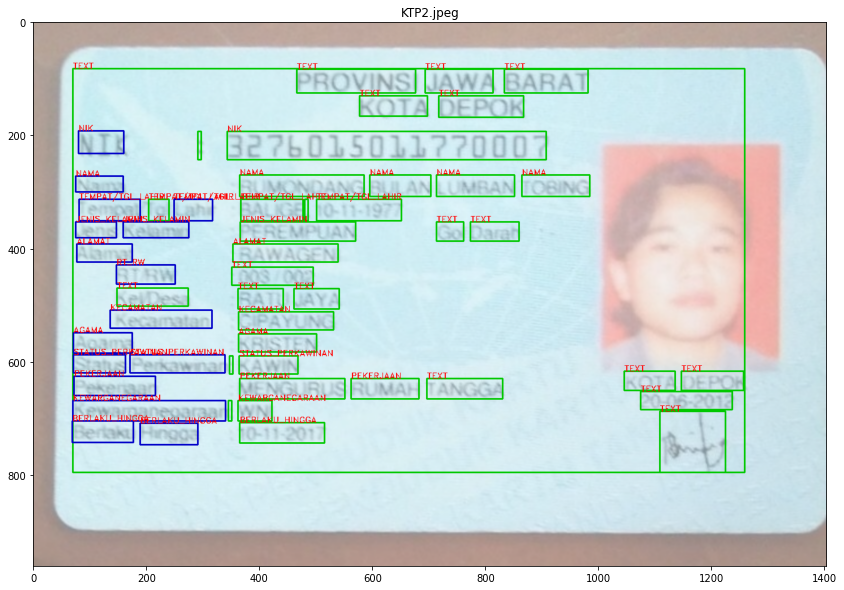

ValueError: The truth value of a DataFrame is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [103]:
import os
import re
import json
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from bpemb import BPEmb
from sklearn import svm
from sklearn import metrics
from pathlib import PosixPath
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
import warnings
from pathlib import Path 
import glob
import math 
import cv2
from sklearn.model_selection import StratifiedShuffleSplit, train_test_split
import numpy as np
import re
from sklearn.svm import LinearSVC, SVC
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import seaborn as sns
import pickle
from functools import partial
from collections import defaultdict

def bboxs_for_file(json_file):
    if not os.path.exists(json_file):
        print(f"{json_file} does not exist")
        print(os.getcwd())
        return []

    text_response = None 
    with open(json_file, "r") as of:
        text_response = json.load(of)

    imgw, imgh = text_response['fullTextAnnotation']['pages'][0]['width'], text_response['fullTextAnnotation']['pages'][0]['height']
    bboxs = []

    if ('textAnnotations' in text_response):
        for i,text in enumerate(text_response['textAnnotations']):
            boxes = {}
        
            x1 = text['boundingPoly']['vertices'][0].get('x',0)
            y1 = text['boundingPoly']['vertices'][0].get('y',0)
            x2 = text['boundingPoly']['vertices'][1].get('x',0)
            y2 = text['boundingPoly']['vertices'][1].get('y',0)
            x3 = text['boundingPoly']['vertices'][2].get('x',0)
            y3 = text['boundingPoly']['vertices'][2].get('y',0)
            x4 = text['boundingPoly']['vertices'][3].get('x',0)
            y4 = text['boundingPoly']['vertices'][3].get('y',0)
            

            xmin = min(x1, x4)
            xmax = max(x2, x3)
            cx = (xmax + xmin) // 2

            ymin = min(y1, y2)
            ymax = max(y3, y4)
            cy = (ymax + ymin) // 2

            center = ( cx/imgw , cy/imgh )
            width = (x2-x1)/imgw
            height = (y3-y2)/imgh

            bboxs.append((text['description'], *center, width, height, imgw, imgh, i==0))
    return bboxs

def load_data(files):
    rows = []

    bboxs_all = []
    for f in files: 
        bboxs = bboxs_for_file(f)
        bboxs_all.extend([(os.path.basename(f), *bb) for bb in bboxs])
        
    df = pd.DataFrame(bboxs_all, columns=['file', 'text', 'cx', 'cy', 'w', 'h', 'imgw', 'imgh', 'is_first'])
    df['cx'] = df['cx'].astype(np.float32)
    df['cy'] = df['cy'].astype(np.float32)
    df['w'] = df['w'].astype(np.float32)
    df['h'] = df['h'].astype(np.float32)
    df['is_first'] = df['is_first'].astype(bool)
    
    return df 

def process_features(df):

    df['f_isdigit'] = df.apply(lambda x: x['text'].isdigit(), axis=1)

    def is_date(x):
        from dateutil.parser import parse
        try: 
            parse(x['text'], fuzzy=False)
            return True
        except (ValueError, OverflowError):
            return False
        
    df['f_isdate'] = df.apply(is_date, axis=1)

    df['f_iszipcode'] = df.apply(lambda x: x['text'].isdigit() and len(x['text']) == 5, axis=1)
    df['f_isalpha'] = df.apply(lambda x: x['text'].isalpha(), axis=1)
    df['f_isalnum'] = df.apply(lambda x: x['text'].isalnum(), axis=1)
    df['f_isnum'] = df.apply(lambda x: x['text'].isnumeric(), axis=1)
    df['f_isnumsym'] = df.apply(lambda x: bool(re.search('^[0-9.,:;!?()]+$/', x['text'])), axis=1)
    df['f_isnumreal'] = df.apply(lambda x: x['text'].isdigit(), axis=1)
    # df['f_iscity'] = df.apply(lambda x: x['text'].isdigit(), axis=1)
    # df['f_iscurrency'] = df.apply(lambda x: x['text'].isdigit(), axis=1)
    # df['f_isgender'] = df.apply(lambda x: x['text'].isdigit(), axis=1)
    # df['f_isnationality'] = df.apply(lambda x: x['text'].isdigit(), axis=1)

    df['f_nik'] = df.apply(lambda x: (x['text'].upper() == 'NIK') or (x['text'].upper() == 'N.I.K.') or (x['text'].upper() == 'N.I.K'), axis=1)
    df['f_nama'] = df.apply(lambda x: x['text'].upper() == 'NAMA', axis=1)
    df['f_jenis'] = df.apply(lambda x: (x['text'].upper() == 'JENIS') or (x['text'].upper() == 'KELAMIN'), axis=1)
    df['f_tempat'] = df.apply(lambda x: (x['text'].upper() == 'TEMPAT') or (x['text'].upper() == 'TGL') or (x['text'].upper() == 'LAHIR'), axis=1)
    # df['f_tgllahir'] = df.apply(lambda x: (x['text'].upper() == 'TGL') or (x['text'].upper() == 'LAHIR'), axis=1)
    df['f_alamat'] = df.apply(lambda x: x['text'].upper() == 'ALAMAT', axis=1)
    df['f_rtrw'] = df.apply(lambda x: (x['text'].upper() == 'RT') or (x['text'].upper() == 'RW') or (x['text'].upper() == 'RT/RW') or (x['text'].upper() == 'RTRW') , axis=1)
    df['f_keldesa'] = df.apply(lambda x: (x['text'].upper() == 'KELDESA') or  (x['text'].upper() == 'KEL') or  (x['text'].upper() == 'DESA'), axis=1)
    df['f_kecamatan'] = df.apply(lambda x: x['text'].upper() == 'KECAMATAN', axis=1)
    df['f_agama'] = df.apply(lambda x: x['text'].upper() == 'AGAMA', axis=1)
    df['f_status_perkawinan'] = df.apply(lambda x: (x['text'].upper() == 'STATUS') or (x['text'].upper() == 'PERKAWINAN') , axis=1)
    df['f_pekerjaan'] = df.apply(lambda x: x['text'].upper() == 'PEKERJAAN', axis=1)
    df['f_kewarganegaraan'] = df.apply(lambda x: x['text'].upper() == 'KEWARGANEGARAAN', axis=1)
    df['f_berlaku'] = df.apply(lambda x: (x['text'].upper() == 'BERLAKU') or (x['text'].upper() == 'HINGGA'), axis=1)


        
    def expsys_ktp_key(x):
        if (x['text'].upper() == 'NIK') or (x['text'].upper() == 'N.I.K.') or (x['text'].upper() == 'N.I.K'):
            return 1
        if x['text'].upper() == 'NAMA':
            return 2
        if (x['text'].upper() == 'JENIS') or (x['text'].upper() == 'KELAMIN'):
            return 4
        if (x['text'].upper() == 'TEMPAT') or (x['text'].upper() == 'TGL') or (x['text'].upper() == 'LAHIR'):
            return 5
        if x['text'].upper() == 'ALAMAT':
            return 6
        if (x['text'].upper() == 'RT') or (x['text'].upper() == 'RW') or (x['text'].upper() == 'RT/RW') or (x['text'].upper() == 'RTRW'):
            return 7
        if (x['text'].upper() == 'KELDESA') or  (x['text'].upper() == 'KEL') or  (x['text'].upper() == 'DESA'):
            return 8
        if (x['text'].upper() == 'KECAMATAN'):
            return 9
        if (x['text'].upper() == 'AGAMA'):
            return 10
        if (x['text'].upper() == 'STATUS') or (x['text'].upper() == 'PERKAWINAN'):
            return 11
        if x['text'].upper() == 'PEKERJAAN':
            return 12
        if x['text'].upper() == 'KEWARGANEGARAAN':
            return 13
        if (x['text'].upper() == 'BERLAKU') or (x['text'].upper() == 'HINGGA'):
            return 14
        return 0

    df['f_y'] = df.apply(expsys_ktp_key, axis=1)

    df['f_len'] = df.apply(lambda x: len(x['text']), axis=1)

    df['f_issym'] = df.apply(lambda x: bool(re.search('^[.,:;!?()\/]+$', x['text'])), axis=1)



    # this assumes that is_first is always a first row. if we reindex the pandas dataframe,
    # then be sure to rewrite the ncx/ncy logic update.
    w = h = cx = cy = 0

    rows = defaultdict(list)

    for _, rr in df.iterrows():
        file = rr['file']
        if rr['is_first']:
            w = rr['w'] * rr['imgw'] 
            h = rr['h'] * rr['imgh']
            cx = rr['cx'] * rr['imgw']
            cy = rr['cy'] * rr['imgh']
            rows['ncx'].append(rr['cx'] * rr['imgw'] / w)
            rows['ncy'].append(rr['cy'] * rr['imgh'] / h)
            rows['nw'].append(rr['w'] * rr['imgw'] / w)
            rows['nh'].append(rr['h'] * rr['imgh'] / h)
        else:
            rows['ncx'].append(rr['cx'] * rr['imgw'] / w)
            rows['ncy'].append(rr['cy'] * rr['imgh'] / h)
            rows['nw'].append(rr['w'] * rr['imgw'] / w)
            rows['nh'].append(rr['h'] * rr['imgh'] / h)

    df['ncx'] = rows['ncx']
    df['ncy'] = rows['ncy']
    df['nw'] = rows['nw']
    df['nh'] = rows['nh']


    df['f_len'] = df.apply(lambda x: len(x['text']), axis=1).astype(int)
    df['cx'] = df['cx'].astype(np.float32)
    df['cy'] = df['cy'].astype(np.float32)
    df['w'] = df['w'].astype(np.float32)
    df['h'] = df['h'].astype(np.float32)
    df['is_first'] = df['is_first'].astype(bool)
    df['f_isdigit'] = df['f_isdigit'].astype(bool)
    df['f_isdate'] = df['f_isdate'].astype(bool)
    df['f_iszipcode'] = df['f_iszipcode'].astype(bool)
    df['f_isalpha'] = df['f_isalpha'].astype(bool)
    df['f_isalnum'] = df['f_isalnum'].astype(bool)
    df['f_isnum'] = df['f_isnum'].astype(bool)
    df['f_isnumsym'] = df['f_isnumsym'].astype(bool)
    df['f_isnumreal'] = df['f_isnumreal'].astype(bool)


    return df 

def load_key_classifier(pkl_file="ktp_keys.pkl"):
    clf = None 
    with open(pkl_file, "rb") as of:
        clf = pickle.load(of)
    assert clf
    return clf 

def predict_keys(df, clf):
    X = df[['f_isdigit', 'f_isdate', 'f_iszipcode', 'f_isalpha', 'f_isalnum',
        'f_isnum', 'f_isnumsym', 'f_isnumreal', 'f_nik', 'f_nama', 'f_jenis',
        'f_tempat', 'f_alamat', 'f_rtrw', 'f_keldesa', 'f_kecamatan', 'f_agama',
        'f_status_perkawinan', 'f_pekerjaan', 'f_kewarganegaraan', 'f_berlaku',
        'f_len', 'ncx', 'ncy']]
    df['f_y'] = clf.predict(X)
    df['f_y'] = df.apply(lambda x: x['f_y'] if not x['is_first'] else 0, axis=1)
    return df 

def predict_value_estimates(df):
    df['v_y'] = 0
    ncy_mean = df[df['f_y'] != 0]['nh'].mean()

    from functools import partial

    def assign_value_fields(df, x):
        if x['f_y'] != 0:
            return 0 #key field
            
        file = x['file']
        res = df[(df['file'] == file) & (df['f_y'] != 0) & (df['ncy'] > x['ncy'] - (ncy_mean*2) ) & (df['ncy'] < x['ncy'] + ncy_mean)] #we allow upper margin (2x), but not lower (0.5). 
        
        if len(res) > 0:
            min_tag = res.iloc[0]['f_y']
            min_dist = 2.0
            
            for _, r in res.iterrows():
                d = math.sqrt((x['ncy']-r['ncy'])**2) #only y distance
                if d < min_dist:
                    min_tag = r['f_y']
                    min_dist = d
            return min_tag
            
        return 0

    df['v_y'] = df.apply(partial(assign_value_fields, df), axis=1)
    return df 

def predict_value(df):
    def closest_one(df, pt):
        dx = df.copy()
        
        dx['dist'] = dx.apply(lambda x: math.sqrt( (x['ncx']-pt[0])**2 + (x['ncy']-pt[1])** 2), axis=1)
        return dx['dist'].idxmin()


    def postprocess(dg, x):
        vy = x['v_y']
        file = x['file']
        
        if vy == 0:
            return 0 
        
        single_value = False #vy in [1, 4, 10, 12]

        dk = dg[(dg['file'] == file) & (dg['f_y'] == vy)]    
        if len(dk) == 0:
            return 0 #there is no key field. we can't match this to anything.
        
        key = dk.iloc[0]

        #VALUE
        dx = dg[(dg['f_y'] == 0) & (dg['v_y'] == vy) & (~dg['is_first'])] 

        c = vy 

        if c == 1: #NIK
            dx = dx[~dx['f_issym']]  
        elif c == 2: #NAMA
            dx = dx[~dx['f_issym']]
        elif c == 4: #JENIS
            #dx = dx[dx['f_isalpha']]
            dx = dx[dx['ncx'] < 0.6]
            dx = dx[~(dx['text'] == 'Gol') & ~(dx['text'] == 'Darah')]
        elif c == 5: #TEMPAT
            dx = dx[dx['f_isalpha'] | dx['f_isdate']]
        elif c == 7: #RTRW
            dx = dx[~(dx['text'] == ':')]
            dx = dx[dx['f_isdigit'] | dx['f_issym'] | dx['f_isnumsym']]
        elif c == 10: #AGAMA
            dx = dx[~(dx['text'] == ':')]
            dx = dx[dx['ncx'] < 0.6]
            dx = dx[dx['f_isalpha']]
        elif c == 11: #STATUS_PERKAWINAN
            dx = dx[dx['ncx'] < 0.6]
            dx = dx[~(dx['text'] == ':')]
            dx = dx[dx['ncx'] < 0.6]
        elif c == 12: #PEKERJAAN
            dx = dx[dx['ncx'] < 0.6]
            dx = dx[dx['f_isalpha']]
            dx = dx[dx['ncx'] < 0.6]
        elif c == 13: #KEWARGANEGARAAN
            dx = dx[dx['ncx'] < 0.6]
            dx = dx[dx['f_isalpha']] 
        elif c == 14: #BERLAKU
            dx = dx[dx['ncx'] < 0.6]
            dx = dx[dx['f_isdate'] | (dx['text'] == 'SEUMUR') | (dx['text'] == 'HIDUP')]

        if len(dx) > 0:
            if single_value:
                idx = closest_one(dx, (key['ncx'], key['ncy']))
                return c if x.index.equals(idx)  else 0
            else:
                return c if x.name in dx.index else 0
        return 0
                
    df['v_y2'] = df.apply(partial(postprocess, df), axis=1)
    return df 


def plot_label(img, label, cx,cy,w,h,color=(0, 181, 20, 255), thickness=2):

    cv2.line(img, (cx-w//2, cy-h//2), (cx+w//2,cy-h//2), color, thickness)
    cv2.line(img, (cx+w//2,cy-h//2),  (cx+w//2,cy+h//2), color, thickness)
    cv2.line(img, (cx+w//2,cy+h//2), (cx-w//2,cy+h//2), color, thickness)
    cv2.line(img, (cx-w//2,cy+h//2), (cx-w//2,cy-h//2), color, thickness)
    
    cv2.putText(img, label, (cx-w//2, cy-h//2), fontFace=cv2.FONT_HERSHEY_DUPLEX,fontScale=.5,color=(255, 0, 0, 255), thickness=1)

def plot_document(img, df):
    classes = ['TEXT',
                'NIK',
                'NAMA',
                'TEXTUNUSED',
                'JENIS_KELAMIN',
                'TEMPAT/TGL_LAHIR',
                'ALAMAT',
                'RT_RW',
                'KEL_DESA',
                'KECAMATAN',
                'AGAMA',
                'STATUS_PERKAWINAN',
                'PEKERJAAN',
                'KEWARGANEGARAAN',
                'BERLAKU_HINGGA']

    scale = 2
    img2 = cv2.resize(img, (img.shape[1] * scale, img.shape[0] * scale))
    img = np.ones((img2.shape), dtype=img.dtype) * 255
    img = cv2.addWeighted(img, 0.5, img2, 0.5, 0.0)
    
    for ix,rr in df.iterrows():
        
        label = f"{classes[rr['v_y2']] if rr['f_y'] == 0 else classes[rr['f_y']]}"
        label = label if len(rr['text']) > 1 else ''
        cx = int(rr['cx']* img.shape[1])
        cy = int(rr['cy']* img.shape[0])
        w = int(rr['w'] * img.shape[1])
        h = int(rr['h'] * img.shape[0])

        color = (0,200,0,255) if rr['f_y'] == 0 else (0,0,200,255)
        plot_label(img, label, cx, cy, w, h, color)

    return img

def plot_figure(file, df):
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img = plot_document(img, df)
    
    plt.figure(figsize=(20,10))
    plt.title(os.path.basename(file))
    plt.imshow(img)
    plt.show()

def to_json(df):
    classes = ['TEXT',
                'nik',
                'nama',
                'TEXTUNUSED',
                'jenis_kelamin',
                'tempat',
                'alamat',
                'rt_rw',
                'kel_desa',
                'kecamatan',
                'agama',
                'status_perkawinan',
                'pekerjaan',
                'kewarganegaraan',
                'berlaku_hingga']

    
    
    res = defaultdict(str)

    for i in range(1,len(classes)):
        if i == 3:
            continue 
        dv = df[df['v_y2'] == i]
        
        if i != 0 or i != 3: #TEXT , TEXTUNUSED
            res[classes[i]] = ' '.join(dv['text'].tolist())
        
    res['tgl_lahir'] = res['tempat']
        
        
    return res 
        
if __name__ == "__main__":
    DATA_DIR = Path("../data/interim/2022-01-06_combined_orc_kyc-key-fields/KTP")
    
    jsonfiles = glob.glob(str(DATA_DIR/"*.json"))
    
    dfres = None
    
    for file in jsonfiles:
        imgfile = os.path.basename(file).split('.')[0]

        if os.path.exists(DATA_DIR/(imgfile + ".jpeg")):
            imgfile = imgfile + ".jpeg"
        elif os.path.exists(DATA_DIR/(imgfile + ".jpg")):
            imgfile = imgfile + ".jpg"
        elif os.path.exists(DATA_DIR/(imgfile + ".png")):
            imgfile = imgfile + ".png"
        elif os.path.exists(DATA_DIR/(imgfile + "webp")):
            imgfile = imgfile + ".webp"
            
        if sum(dfgood['file'] == imgfile) == 0:
            continue 
        #file = "KTP29.json"
        #imgfile = "KTP29.jpeg"

        df = load_data([file])
        df = process_features(df)
        df = predict_keys(df, load_key_classifier("../src/ktp_expertsys_cymatch/ktp_keys.pkl"))
        df = predict_value_estimates(df)
        df = predict_value(df)
        
        if dfres:
            dfres = pd.Concat([dfres, df], axis=1)
        else:
            dfres = df 
            
        print(to_json(df))
        print(imgfile)
        plot_figure(str(DATA_DIR/imgfile), df)

In [104]:
dfres.shape

(54, 39)

In [102]:
dfgood = df.copy()

In [ ]:
fields = ['nik', 'nama', 'tgl_lahir', 'jenis_kelamin', 'tempat', 'alamat', 'rt_rw', 'kel_desa',
            'kecamatan', 'agama', 'status_perkawinan', 'pekerjaan',
            'kewarganegaraan', 'berlaku_hingga']